<a href="https://colab.research.google.com/github/shubhanshi01/Advanced-Persistent-Threat-Detection-Using-Temporal-Graph-Neural-Networks/blob/main/CIC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
pd.set_option("display.max_columns",None)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%pip install missingno

import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt

In [ ]:
# Loading the dataset
data1 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')
data2 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data3 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data4 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Monday-WorkingHours.pcap_ISCX.csv')
data5 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data7 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Tuesday-WorkingHours.pcap_ISCX.csv')
data8 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Wednesday-workingHours.pcap_ISCX.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv'

In [ ]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 225745 rows, 79 columns
Data2 -> 286467 rows, 79 columns
Data3 -> 191033 rows, 79 columns
Data4 -> 529918 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 170366 rows, 79 columns
Data7 -> 445909 rows, 79 columns
Data8 -> 692703 rows, 79 columns


In [ ]:
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [ ]:
# Deleting dataframes after concating to save memory
for d in data_list: del d

In [ ]:
data.columns

Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', '

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2830743 entries, 0 to 692702
Data columns (total 79 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0    Destination Port             int64  
 1    Flow Duration                int64  
 2    Total Fwd Packets            int64  
 3    Total Backward Packets       int64  
 4   Total Length of Fwd Packets   int64  
 5    Total Length of Bwd Packets  int64  
 6    Fwd Packet Length Max        int64  
 7    Fwd Packet Length Min        int64  
 8    Fwd Packet Length Mean       float64
 9    Fwd Packet Length Std        float64
 10  Bwd Packet Length Max         int64  
 11   Bwd Packet Length Min        int64  
 12   Bwd Packet Length Mean       float64
 13   Bwd Packet Length Std        float64
 14  Flow Bytes/s                  float64
 15   Flow Packets/s               float64
 16   Flow IAT Mean                float64
 17   Flow IAT Std                 float64
 18   Flow IAT Max               

In [ ]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [ ]:
pd.options.display.max_columns = 80
data

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,54865,3,2,0,12,0,6,6,6.0,0.00000,0,0,0.0,0.0,4.000000e+06,666666.666700,3.0,0.000000,3,3,3,3.00000,0.00000,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,666666.666700,0.000000,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,0,0,0,0,9.000000,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,33,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,55054,109,1,1,6,6,6,6,6.0,0.00000,6,6,6.0,0.0,1.100917e+05,18348.623850,109.0,0.000000,109,109,0,0.00000,0.00000,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,9174.311927,9174.311927,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,29,256,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,55055,52,1,1,6,6,6,6,6.0,0.00000,6,6,6.0,0.0,2.307692e+05,38461.538460,52.0,0.000000,52,52,0,0.00000,0.00000,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,19230.769230,19230.769230,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,29,256,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,46236,34,1,1,6,6,6,6,6.0,0.00000,6,6,6.0,0.0,3.529412e+05,58823.529410,34.0,0.000000,34,34,0,0.00000,0.00000,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,29411.764710,29411.764710,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,31,329,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,54863,3,2,0,12,0,6,6,6.0,0.00000,0,0,0.0,0.0,4.000000e+06,666666.666700,3.0,0.000000,3,3,3,3.00000,0.00000,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,666666.666700,0.000000,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,0,0,0,0,9.000000,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,32,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692698,53,32215,4,2,112,152,28,28,28.0,0.00000,76,76,76.0,0.0,8.194940e+03,186.248642,6443.0,13617.579480,30780,3,30832,10277.33333,17755.84381,30780,4,3,3.0,0.0,3,3,0,0,0,0,80,64,124.165761,62.082881,28,76,41.714286,23.421602,548.571429,0,0,0,0,0,0,0,0,0,48.666667,28.0,76.0,80,0,0,0,0,0,0,4,112,2,152,-1,-1,3,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692699,53,324,2,2,84,362,42,42,42.0,0.00000,181,181,181.0,0.0,1.376543e+06,12345.679010,108.0,183.597386,320,2,2,2.00000,0.00000,2,2,2,2.0,0.0,2,2,0,0,0,0,40,40,6172.839506,6172.839506,42,181,97.600000,76.133435,5796.300000,0,0,0,0,0,0,0,0,1,122.000000,42.0,181.0,40,0,0,0,0,0,0,2,84,2,362,-1,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
692700,58030,82,2,1,31,6,31,0,15.5,21.92031,6,6,6.0,0.0,4.512195e+05,36585.365850,41.0,52.325902,78,4,4,4.00000,0.00000,4,4,0,0.0,0.0,0,0,1,0,0,0,64,20,24390.243900,12195.121950,0,31,17.000000,16.3

**Data cleaning**

In [ ]:
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 308381


In [ ]:
data.drop_duplicates(inplace = True)
data.shape

(2522362, 79)

In [ ]:
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow Bytes/s    353
dtype: int64


In [ ]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s       1211
 Flow Packets/s    1564
dtype: int64


In [ ]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [ ]:
missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s       1564
 Flow Packets/s    1564
dtype: int64


In [ ]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                 Missing Values  Percentage of Total Values
Flow Bytes/s               1564                        0.06
 Flow Packets/s            1564                        0.06


**Visualisation of data**

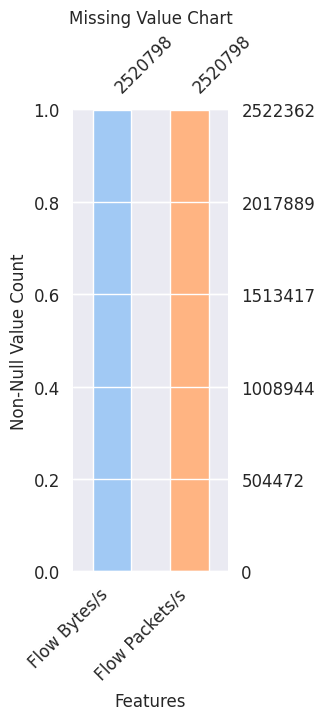

In [ ]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

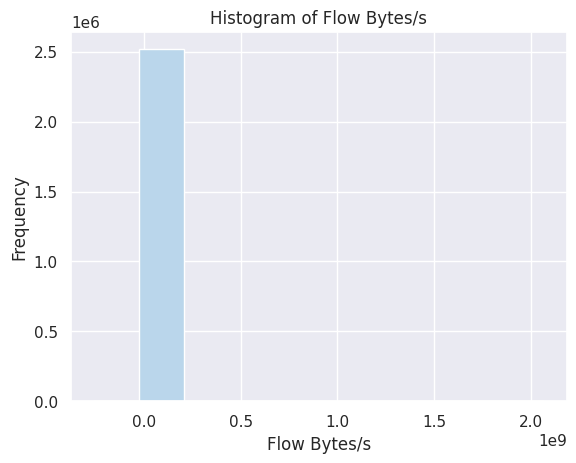

In [ ]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()


Unique values and their counts in ' Flow Packets/s':
 Flow Packets/s
6.666667e+05    34930
5.000000e+05    25219
6.666667e+05    16207
2.000000e+06    14937
4.081633e+04     7637
                ...  
5.467620e+01        1
2.420956e+01        1
5.512013e+02        1
4.785038e+01        1
1.779599e+00        1
Name: count, Length: 1240163, dtype: int64


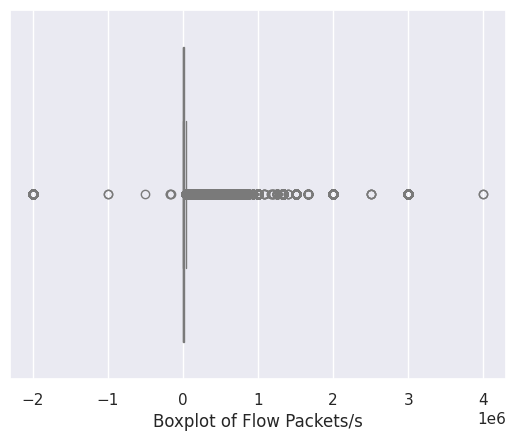

In [ ]:
# Reset the index of the dataframe to ensure a unique index (already suggested, keeping it)
data = data.reset_index(drop=True)

# Inspect the unique values and their counts in the target column
print("\nUnique values and their counts in ' Flow Packets/s':")
print(data[' Flow Packets/s'].value_counts())

# Replace 'Flow Packets/s' with the correct column name if it's different
# We will keep the plotting code as is for now, but the inspection above will help
# diagnose the issue. If there are a huge number of identical values, particularly 0,
# we might need to consider different plotting approaches or data transformations.
sns.boxplot(x = data[" Flow Packets/s"])
plt.xlabel("Boxplot of Flow Packets/s")
plt.show()

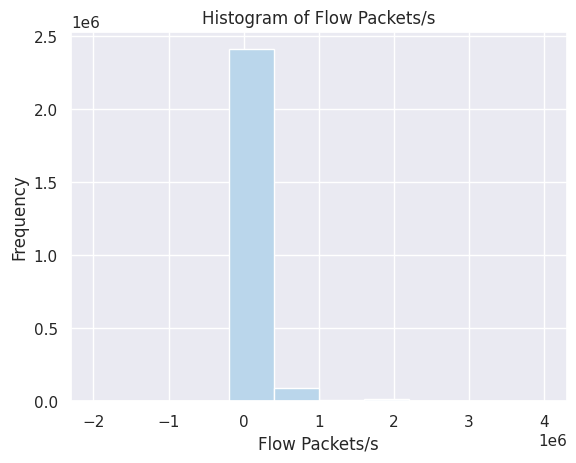

In [ ]:
plt.hist(data[' Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [ ]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data[' Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [ ]:
# Filling missing values with median
data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
data[' Flow Packets/s'].fillna(med_flow_packets, inplace = True)

/tmp/ipython-input-22-1457703491.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
/tmp/ipython-input-22-1457703491.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpla

In [ ]:
print('Number of \'Flow Bytes/s\' missing values:', data['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', data[' Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


In [ ]:
data[' Label'].unique()

array(['BENIGN', 'DDoS', 'PortScan', 'Bot', 'Infiltration',
       'Web Attack � Brute Force', 'Web Attack � XSS',
       'Web Attack � Sql Injection', 'FTP-Patator', 'SSH-Patator',
       'DoS slowloris', 'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye',
       'Heartbleed'], dtype=object)

In [ ]:
data[' Label'].value_counts()

,count
Label,
BENIGN,2096484
DoS Hulk,172849
DDoS,128016
PortScan,90819
DoS GoldenEye,10286
FTP-Patator,5933
DoS slowloris,5385
DoS Slowhttptest,5228
SSH-Patator,3219


In [ ]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web Attack',
    'Web Attack � XSS': 'Web Attack',
    'Web Attack � Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data[' Label'].map(attack_map)

In [ ]:
data.drop(' Label', axis = 1, inplace = True)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[0 3 7 1 6 8 2 4 5]


In [ ]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


In [ ]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

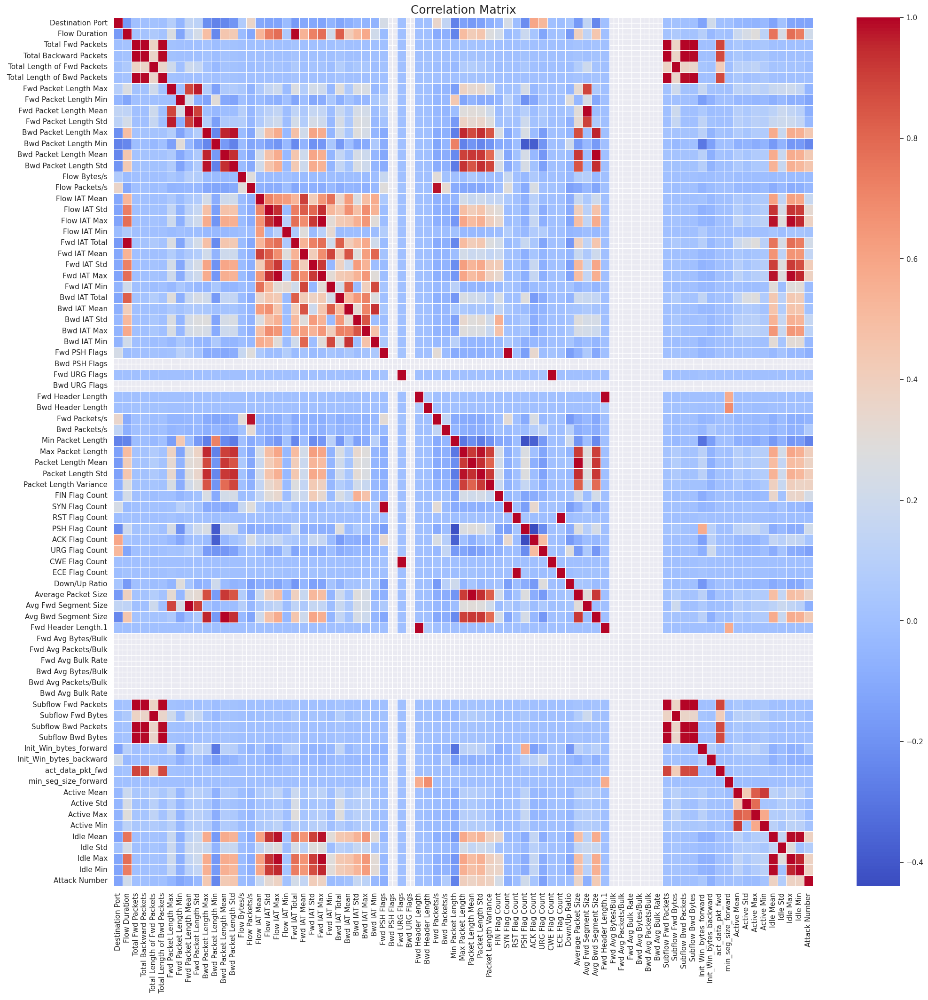

In [ ]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [ ]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.   Flow Duration           :0.21
2.  Bwd Packet Length Max    :0.44
3.   Bwd Packet Length Mean  :0.43
4.   Bwd Packet Length Std   :0.45
5.   Flow IAT Mean           :0.17
6.   Flow IAT Std            :0.33
7.   Flow IAT Max            :0.38
8.   Flow IAT Min            :0.01
9.  Fwd IAT Total            :0.22
10.  Fwd IAT Mean            :0.15
11.  Fwd IAT Std             :0.41
12.  Fwd IAT Max             :0.38
13.  Bwd IAT Mean            :0.01
14.  Bwd IAT Std             :0.16
15.  Bwd IAT Max             :0.12
16.  Bwd Packets/s           :0.07
17.  Max Packet Length       :0.4
18.  Packet Length Mean      :0.37
19.  Packet Length Std       :0.41
20.  Packet Length Variance  :0.38
21. FIN Flag Count           :0.23
22.  PSH Flag Count          :0.21
23.  ACK Flag Count          :0.03
24.  Average Packet Size     :0.36
25.  Avg Bwd Segment Size    :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [ ]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 32


In [ ]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

[' Bwd PSH Flags',
 ' Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 ' Fwd Avg Packets/Bulk',
 ' Fwd Avg Bulk Rate',
 ' Bwd Avg Bytes/Bulk',
 ' Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

In [ ]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(504472, 80)

In [ ]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
 Destination Port               8704.762165           8709.619693           0.06%
 Flow Duration                  16581323.773163       16664541.182583       0.50%
 Total Fwd Packets              10.276271             11.801783             14.84%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Total Backward Packets         11.565964             13.671102             18.20%
Total Length of Fwd Packets     611.575108            609.676051            0.31%
 Total Length of Bwd Packets    18133.153930          22797.828210          25.72%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Fwd Packet Length Max          231.091768            233.184968            0.91%
 Fwd Packet Length Min          19.194641             19.227202             0.17%
 Fwd Packet Length Mean         63.470104             63.967652             0.78%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Fwd Packet Length Std          77.277587             78.211522             1.21%
Bwd Packet Length Max           974.370031            974.205314            0.02%
 Bwd Packet Length Min          43.134670             43.136188             0.00%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Bwd Packet Length Mean         340.413252            340.147273            0.08%
 Bwd Packet Length Std          376.311810            375.978616            0.09%
Flow Bytes/s                    1409834.540580        1354378.623235        3.93%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Flow Packets/s                 47262.603268          47040.664859          0.47%
 Flow IAT Mean                  1445245.597645        1451209.758825        0.41%
 Flow IAT Std                   3276120.003337        3285421.146530        0.28%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Flow IAT Max                   10293098.691924       10324990.025290       0.31%
 Flow IAT Min                   170315.698627         172114.015073         1.06%
Fwd IAT Total                   16241759.007512       16323530.876360       0.50%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Fwd IAT Mean                   2917447.144105        2928333.466537        0.37%
 Fwd IAT Std                    3666365.865689        3679891.360516        0.37%
 Fwd IAT Max                    10136646.258398       10170595.389157       0.33%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Fwd IAT Min                    1134966.753752        1137825.624043        0.25%
Bwd IAT Total                   11103358.523806       11190684.197282       0.79%
 Bwd IAT Mean                   2026476.920068        2033360.711983        0.34%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Bwd IAT Std                    1667646.690399        1682435.202259        0.89%
 Bwd IAT Max                    5257357.549892        5296220.704721        0.74%
 Bwd IAT Min                    1085437.767545        1084244.274313        0.11%
Fwd PSH Flags                   0.048738              0.048934              0.40%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Bwd PSH Flags                  0.000000              0.000000              0.00%
 Fwd URG Flags                  0.000032              0.000030              6.25%
 Bwd URG Flags                  0.000000              0.000000              0.00%
 Fwd Header Length              -29182.101016         -25192.870607         13.67%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Bwd Header Length              -2553.643801          -182.492301           92.85%
Fwd Packets/s                   40834.353243          40668.105738          0.41%
 Bwd Packets/s                  6509.474728           6463.699743           0.70%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Min Packet Length              16.823494             16.826422             0.02%
 Max Packet Length              1063.097507           1064.619073           0.14%
 Packet Length Mean             190.541501            190.652471            0.06%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Packet Length Std              329.998773            330.374342            0.11%
 Packet Length Variance         545438.614758         545927.972449         0.09%
FIN Flag Count                  0.032147              0.032414              0.83%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 SYN Flag Count                 0.048738              0.048934              0.40%
 RST Flag Count                 0.000272              0.000274              0.58%
 PSH Flag Count                 0.297519              0.297293              0.08%
 ACK Flag Count                 0.312188              0.312015              0.06%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 URG Flag Count                 0.101428              0.101001              0.42%
 CWE Flag Count                 0.000032              0.000030              6.25%
 ECE Flag Count                 0.000273              0.000278              1.60%
 Down/Up Ratio                  0.700350              0.699559              0.11%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Average Packet Size            212.311468            212.389738            0.04%
 Avg Fwd Segment Size           63.470104             63.967652             0.78%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Avg Bwd Segment Size           340.413252            340.147273            0.08%
 Fwd Header Length.1            -29182.101016         -25192.870607         13.67%
Fwd Avg Bytes/Bulk              0.000000              0.000000              0.00%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Fwd Avg Packets/Bulk           0.000000              0.000000              0.00%
 Fwd Avg Bulk Rate              0.000000              0.000000              0.00%
 Bwd Avg Bytes/Bulk             0.000000              0.000000              0.00%
 Bwd Avg Packets/Bulk           0.000000              0.000000              0.00%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

Bwd Avg Bulk Rate               0.000000              0.000000              0.00%
Subflow Fwd Packets             10.276271             11.801783             14.84%
 Subflow Fwd Bytes              611.563349            609.676051            0.31%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Subflow Bwd Packets            11.565964             13.671102             18.20%
 Subflow Bwd Bytes              18132.772274          22797.595250          25.73%
Init_Win_bytes_forward          7265.655351           7260.537927           0.07%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Init_Win_bytes_backward        2230.826079           2250.854386           0.90%
 act_data_pkt_fwd               6.005904              6.752303              12.43%
 min_seg_size_forward           -3080.307029          -1869.751598          39.30%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

Active Mean                     91521.689172          92486.524319          1.05%
 Active Std                     46163.125326          46237.941638          0.16%
 Active Max                     171910.435398         173586.180069         0.97%


/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating key

 Active Min                     65422.995532          66368.983823          1.45%
Idle Mean                       9331577.511171        9358362.943227        0.29%
 Idle Std                       565443.316197         573084.314017         1.35%


/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipython-input-36-580325769.py:9: FutureWarning: Series.__getitem__ trea

 Idle Max                       9757716.419817        9790248.714614        0.33%
 Idle Min                       8887156.719966        8907697.532571        0.23%
Attack Number                   0.726480              0.723656              0.39%


/tmp/ipython-input-36-580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]


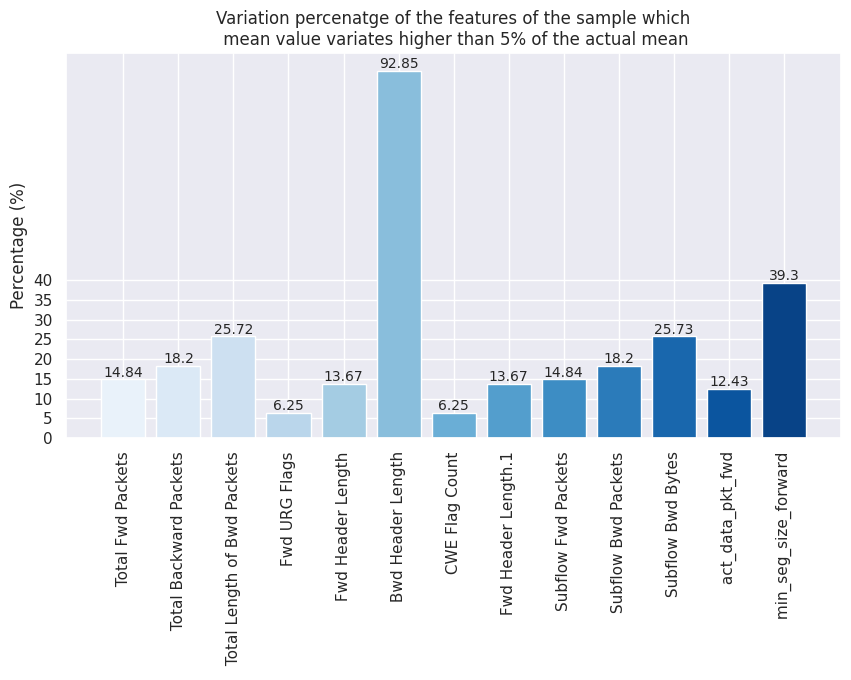

In [ ]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [ ]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.   Destination Port             : 33264
2.   Flow Duration                : 256319
3.   Total Fwd Packets            : 683
4.   Total Backward Packets       : 838
5.  Total Length of Fwd Packets   : 9099
6.   Total Length of Bwd Packets  : 24229
7.   Fwd Packet Length Max        : 3686
8.   Fwd Packet Length Min        : 242
9.   Fwd Packet Length Mean       : 35277
10.  Fwd Packet Length Std        : 66362
11. Bwd Packet Length Max         : 3888
12.  Bwd Packet Length Min        : 450
13.  Bwd Packet Length Mean       : 45979
14.  Bwd Packet Length Std        : 62866
15. Flow Bytes/s                  : 347114
16.  Flow Packets/s               : 288254
17.  Flow IAT Mean                : 274064
18.  Flow IAT Std                 : 229405
19.  Flow IAT Max                 : 166881
20.  Flow IAT Min                 : 45911
21. Fwd IAT Total                 : 119286
22.  Fwd IAT Mean                 : 164137
23.  Fwd IAT Std                  : 148396
24.  Fwd IA

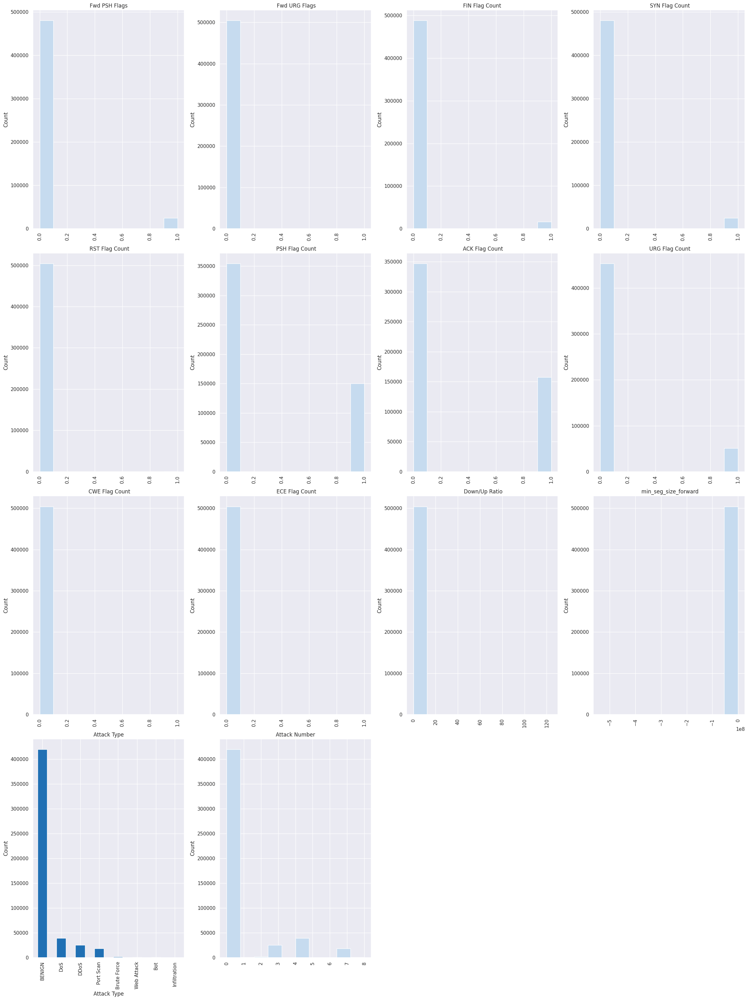

In [ ]:
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [ ]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


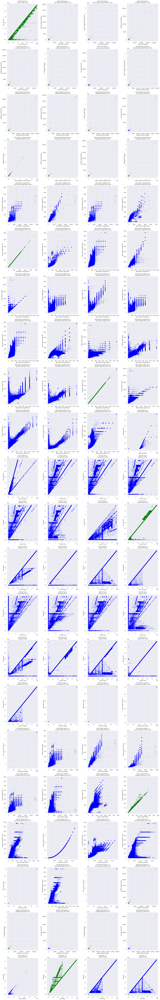

In [ ]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [ ]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [ ]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                              Outlier Count  Outlier Percentage
 Destination Port                    109264               21.66
 Flow Duration                        94059               18.65
 Total Fwd Packets                    50548               10.02
 Total Backward Packets               47917                9.50
Total Length of Fwd Packets           62997               12.49
 Total Length of Bwd Packets         114946               22.79
 Fwd Packet Length Max                48745                9.66
 Fwd Packet Length Min                 2611                0.52
 Fwd Packet Length Mean               35787                7.09
 Fwd Packet Length Std                47276                9.37
Bwd Packet Length Max                 75002               14.87
 Bwd Packet Length Min                13507                2.68
 Bwd Packet Length Mean               87556               17.36
 Bwd Packet Length Std                89801               17.80
Flow Bytes/s                          95

In [ ]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature:  Destination Port
- BENIGN: 93837 (22.36%)
- DoS: 0 (0.00%)
- DDoS: 0 (0.00%)
- Port Scan: 2209 (12.25%)
- Brute Force: 0 (0.00%)
- Bot: 0 (0.00%)
- Web Attack: 0 (0.00%)
- Infiltration: 0 (0.00%)

Feature:  Flow Duration
- BENIGN: 97520 (23.24%)
- DoS: 8490 (21.85%)
- DDoS: 4318 (17.01%)
- Port Scan: 389 (2.16%)
- Brute Force: 426 (24.41%)
- Bot: 86 (22.57%)
- Web Attack: 60 (14.32%)
- Infiltration: 0 (0.00%)

Feature:  Total Fwd Packets
- BENIGN: 78213 (18.64%)
- DoS: 489 (1.26%)
- DDoS: 816 (3.21%)
- Port Scan: 280 (1.55%)
- Brute Force: 0 (0.00%)
- Bot: 8 (2.10%)
- Web Attack: 60 (14.32%)
- Infiltration: 1 (10.00%)

Feature:  Total Backward Packets
- BENIGN: 60289 (14.37%)
- DoS: 4517 (11.62%)
- DDoS: 0 (0.00%)
- Port Scan: 97 (0.54%)
- Brute Force: 0 (0.00%)
- Bot: 8 (2.10%)
- Web Attack: 37 (8.83%)
- Infiltration: 1 (10.00%)

Feature: Total Length of Fwd Packets
- BENIGN: 80572 (19.20%)
- DoS: 10164 (26.16%)
- DDoS: 4610 (18.16%)
- Port Scan: 118 (0.65%)
- Brute Force: 0

In [ ]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

 As we have a large dataset, it was  sampled 20% of the dataset . the sample is representative of the population by doing a comparison of descriptive statistics (mean) and features that variates 5%
higher than the actual mean values of the dataset.

- A histogram for numerical columns and a bar plot for categorical columns are generated that have more than one unique value and less than 50 unique values.

- The scatter plots show the relationship between strongly positive correlated features with a correlation coefficient of 0.85 or higher. Blue scatter plot points show the correlation coefficient pairs less than 0.99 and green scatter plot points show the pairs with 0.99 or almost 1.0. From these plots, we can visualize linear relationships between the features or identify indications of multicollinearity between features where two or more predictors are highly correlated. Highly correlated features introduce multicollinearity which causes problems for machine learning algorithms because it assumes that the features are independent. From some of the plots, we can see that there is a tight cluster of data points around
the straight line where the correlation coefficient is close to 1.

- We identified the outliers of each feature based on attack types and found that this dataset contains many outliers. Outliers increase variability in the dataset. But in the dataset, outliers may indicate different patterns like network intrusion attempts.


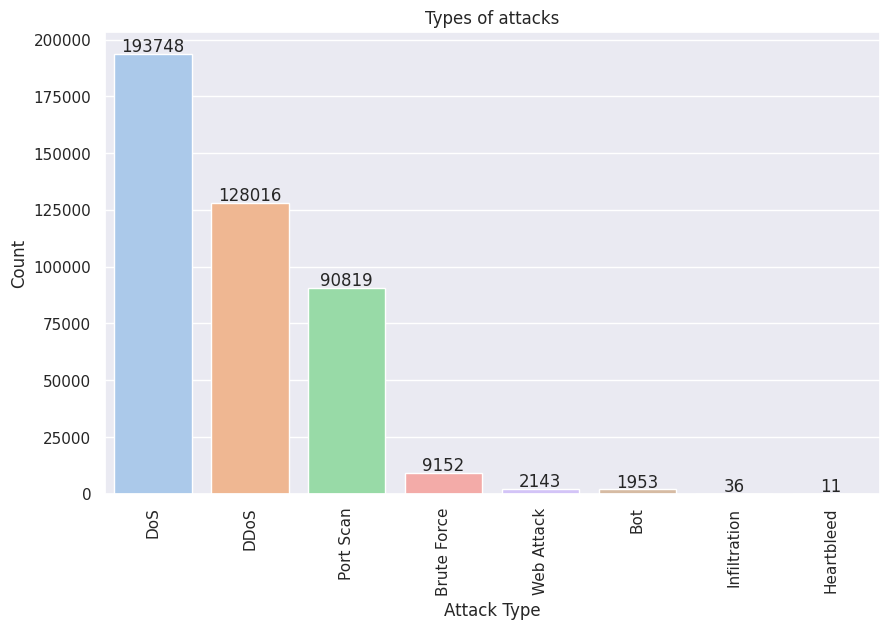

In [ ]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

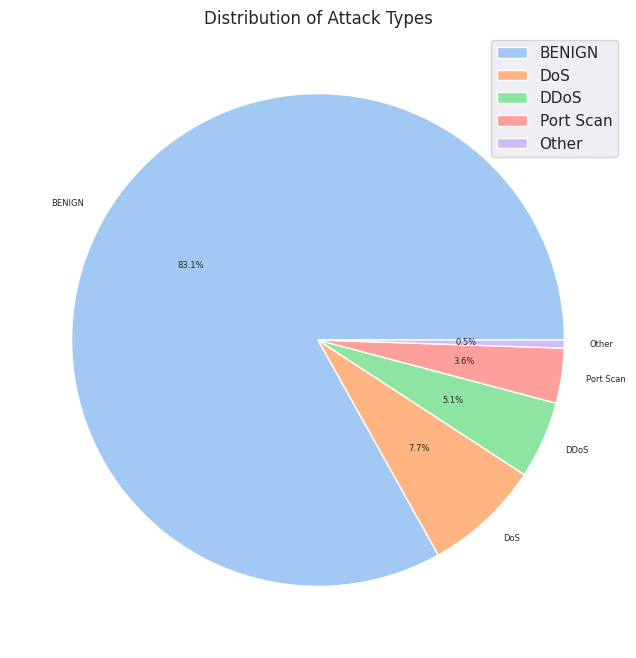

In [ ]:
attack_counts = data['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

In [ ]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Number
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,54865,3,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,4.000000e+06,666666.666700,3.000000e+00,0.000000e+00,3,3,3,3.000000e+00,0.000000e+00,3,3,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,666666.666700,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,0,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,33,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000,1
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0,2
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0,3
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0,4
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,118,32,2217.0,0.00000,221

In [ ]:
import os
# Define the path to the desired folder in your Google Drive
drive_path = '/content/drive/My Drive/cleaned_cic_data'

# Create the folder in Google Drive if it doesn't exist
os.makedirs(drive_path, exist_ok=True)

# Define the full path to save the cleaned data file in Google Drive
drive_file_path = os.path.join(drive_path, "cleaned_dataframe.csv")

# Save the cleaned DataFrame to Google Drive
data.to_csv(drive_file_path, index=False)

print(f"Cleaned data saved to Google Drive at: {drive_file_path}")


Cleaned data saved to Google Drive at: /content/drive/My Drive/cleaned_cic_data/cleaned_dataframe.csv


In [ ]:
import pandas as pd
data=pd.read_csv('/content/drive/My Drive/cleaned_cic_data/cleaned_dataframe.csv')
data.columns

Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', '

In [ ]:
import networkx as nx
import pandas as pd
import random
import numpy as np


In [ ]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 1539.53 MB
Final memory usage: 798.63 MB


In [ ]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index([' Bwd PSH Flags', ' Bwd URG Flags', 'Fwd Avg Bytes/Bulk',
       ' Fwd Avg Packets/Bulk', ' Fwd Avg Bulk Rate', ' Bwd Avg Bytes/Bulk',
       ' Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

- To improve performance and reduce the risk of memory-related errors (mostly session crashes), we downcasted the float and integer values based on the presence of the minimum and maximum values and reduced memory usage by 47.5%.

- The columns with zero standard deviation have the same value in all rows.
These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns. These columns cannot help differentiate between the classes or groups of data. So, we dropped the columns that have no variation.


In [ ]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 48.12%


In [ ]:
# Standardizing the dataset
from sklearn.preprocessing import StandardScaler

features = data.drop('Attack Type', axis = 1)
attacks = data['Attack Type']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [ ]:
from sklearn.decomposition import IncrementalPCA

size = len(features.columns) // 2
ipca = IncrementalPCA(n_components = size, batch_size = 500)
for batch in np.array_split(scaled_features, len(features) // 500):
    ipca.partial_fit(batch)

print(f'information retained: {sum(ipca.explained_variance_ratio_):.2%}')

information retained: 99.10%


In [ ]:
data.columns

Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Fwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',
       ' Packet Length Mean', ' Packet Length Std', ' Packet Length Variance',
       'FIN Flag Count', ' SYN Flag Count', 

In [ ]:
transformed_features = ipca.transform(scaled_features)
new_data = pd.DataFrame(transformed_features, columns = [f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values

In [ ]:
new_data.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
       'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26', 'PC27', 'PC28',
       'PC29', 'PC30', 'PC31', 'PC32', 'PC33', 'PC34', 'PC35', 'Attack Type'],
      dtype='object')

In [ ]:

attack_types = data['Attack Type'].unique()
attack_types


array(['BENIGN', 'DDoS', 'Port Scan', 'Bot', 'Infiltration', 'Web Attack',
       'Brute Force', 'DoS', 'Heartbleed'], dtype=object)

In [ ]:
data_by_attack_type = {}

# Iterate through each unique attack type and create a separate dataframe
for attack_type in attack_types:
  data_by_attack_type[attack_type] = data[data['Attack Type'] == attack_type].copy()

# Example of accessing a specific dataframe (e.g., for 'BENIGN')
benign_data = data_by_attack_type.get('BENIGN')
bruteforce_data = data_by_attack_type['Bot']
scan_data = data_by_attack_type['Brute Force']
injection_data = data_by_attack_type['DDoS']
dos_data = data_by_attack_type['DoS']
port_scan_data = data_by_attack_type['Port Scan']
malware_data = data_by_attack_type['Heartbleed']
discovery_data = data_by_attack_type['Infiltration']
exfiltration_data = data_by_attack_type['Web Attack']



# Print the shape of each generated dataframe to verify
for attack_type, df in data_by_attack_type.items():
  print(f"Shape of dataframe for '{attack_type}': {df.shape}")

Shape of dataframe for 'BENIGN': (2096484, 72)
Shape of dataframe for 'DDoS': (128016, 72)
Shape of dataframe for 'Port Scan': (90819, 72)
Shape of dataframe for 'Bot': (1953, 72)
Shape of dataframe for 'Infiltration': (36, 72)
Shape of dataframe for 'Web Attack': (2143, 72)
Shape of dataframe for 'Brute Force': (9152, 72)
Shape of dataframe for 'DoS': (193748, 72)
Shape of dataframe for 'Heartbleed': (11, 72)


In [ ]:
# Step 1: Compute correlations
correlations = {}
for attack_type, df in data_by_attack_type.items():
    correlations[attack_type] = df.corr(numeric_only = True)

# Step 2: Extract highly correlated feature pairs for each attack type
def get_high_corr_features(corr_matrix, threshold=0.95):
    high_corr_pairs = corr_matrix[(corr_matrix > threshold) & (corr_matrix < 1.0)].stack()
    feature_set = set()
    for (f1, f2), _ in high_corr_pairs.items():
        feature_set.update([f1, f2])  # Add both features
    return feature_set

# Step 3: Collect feature sets for selected attack types
attack_types_to_compare = ['BENIGN', 'DDoS', 'Port Scan', 'Bot', 'Infiltration', 'Web Attack',
       'Brute Force', 'DoS', 'Heartbleed']
high_corr_feature_sets = {atype: get_high_corr_features(correlations[atype])
                          for atype in attack_types_to_compare}

# Step 4: Find common features
common_features = set.intersection(*high_corr_feature_sets.values())

# Step 5: Print results
print("Common highly correlated features across BENIGN','Bruteforce','Exfiltration','Scan', 'Malware', 'Injection','Discovery':")
for feature in common_features:
    print(f"- {feature}")

Common highly correlated features across BENIGN','Bruteforce','Exfiltration','Scan', 'Malware', 'Injection','Discovery':
-  Flow IAT Max
-  Flow Packets/s
-  Fwd IAT Max
-  Average Packet Size
-  Flow Duration
-  Packet Length Mean
- Bwd IAT Total
- Fwd IAT Total


In [ ]:
print(data['Attack Type'].value_counts())

Attack Type
BENIGN          2096484
DoS              193748
DDoS             128016
Port Scan         90819
Brute Force        9152
Web Attack         2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: count, dtype: int64


In [ ]:
!pip install torch_geometric

In [ ]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.9)
X = data.drop(["Fwd IAT Total",'Bwd IAT Total',' Average Packet Size',' Fwd IAT Max',' Flow IAT Max',' Flow Duration',' Flow Packets/s',' Packet Length Mean','Attack Type'], axis=1)
X_sel = sel.fit_transform(X)
kept_cols = X.columns[sel.get_support()]
print("Kept features after VarianceThreshold:", list(kept_cols))


Kept features after VarianceThreshold: [' Destination Port', ' Total Fwd Packets', ' Total Backward Packets', 'Total Length of Fwd Packets', ' Total Length of Bwd Packets', ' Fwd Packet Length Max', ' Fwd Packet Length Min', ' Fwd Packet Length Mean', ' Fwd Packet Length Std', 'Bwd Packet Length Max', ' Bwd Packet Length Min', ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Min', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Min', ' Bwd IAT Mean', ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length', ' Packet Length Std', ' Packet Length Variance', ' Avg Fwd Segment Size', ' Avg Bwd Segment Size', ' Fwd Header Length.1', 'Subflow Fwd Packets', ' Subflow Fwd Bytes', ' Subflow Bwd Packets', ' Subflow Bwd Bytes', 'Init_Win_bytes_forward', ' Init_Win_bytes_backward', ' act_data_pkt_fwd', ' min_seg_size_forward',

In [ ]:
pca_df=new_data.copy()

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import NearestNeighbors
import gc
import warnings
warnings.filterwarnings('ignore')

# ===============================
# MEMORY-OPTIMIZED PREPROCESSOR
# ===============================

class MemoryEfficientAPTPreprocessor:
    def __init__(self, max_nodes=10000, k_neighbors=3, batch_size=1000):
        """
        Memory-efficient preprocessor for large datasets

        Args:
            max_nodes: Maximum number of nodes to process
            k_neighbors: Number of neighbors for each node (reduced for memory)
            batch_size: Batch size for processing
        """
        self.max_nodes = max_nodes
        self.k_neighbors = k_neighbors
        self.batch_size = batch_size
        self.label_encoder = LabelEncoder()
        self.scaler = StandardScaler()

    def sample_data(self, df):
        """Sample data to manageable size with class balance handling"""
        print(f"Original data shape: {df.shape}")
        print("Class distribution:")
        class_counts = df['Attack Type'].value_counts()
        print(class_counts)

        # Remove classes with very few samples (less than 10)
        min_samples = 10
        valid_classes = class_counts[class_counts >= min_samples].index
        df_filtered = df[df['Attack Type'].isin(valid_classes)].copy()

        print(f"After filtering rare classes: {df_filtered.shape}")
        print(f"Remaining classes: {len(valid_classes)}")

        if len(df_filtered) > self.max_nodes:
            print(f"Sampling {self.max_nodes} rows from {len(df_filtered)} total rows...")

            # Ensure minimum samples per class for train/test split
            min_per_class = max(6, self.max_nodes // len(valid_classes) // 10)
            max_per_class = self.max_nodes // len(valid_classes)

            sample_dfs = []
            for class_name in valid_classes:
                class_data = df_filtered[df_filtered['Attack Type'] == class_name]
                n_samples = min(len(class_data), max(min_per_class, max_per_class))
                sampled = class_data.sample(n_samples, random_state=42)
                sample_dfs.append(sampled)

            sample_df = pd.concat(sample_dfs, ignore_index=True)

            # Final shuffle
            sample_df = sample_df.sample(frac=1, random_state=42).reset_index(drop=True)

            print(f"Final sampled data shape: {sample_df.shape}")
            print("Final class distribution:")
            print(sample_df['Attack Type'].value_counts())
            return sample_df

        return df_filtered

    def prepare_data(self, df):
        """Prepare data with memory optimization"""
        print("Preparing data...")

        # Sample if too large
        df_sampled = self.sample_data(df)

        # Extract features and labels
        feature_cols = [col for col in df_sampled.columns if col.startswith('PC')]
        X = df_sampled[feature_cols].values.astype(np.float32)  # Use float32 to save memory
        y = df_sampled['Attack Type'].values

        # Encode labels
        y_encoded = self.label_encoder.fit_transform(y)

        # Scale features
        X_scaled = self.scaler.fit_transform(X)

        print(f"Final data shape: {X_scaled.shape}")
        print(f"Classes: {len(np.unique(y_encoded))}")

        return X_scaled, y_encoded

    def create_knn_edges(self, X):
        """Create edges using KNN for memory efficiency"""
        print(f"Creating KNN edges with k={self.k_neighbors}...")

        # Use NearestNeighbors for memory-efficient edge creation
        nbrs = NearestNeighbors(n_neighbors=self.k_neighbors + 1, algorithm='auto', n_jobs=-1)
        nbrs.fit(X)

        # Get neighbors in batches to save memory
        edge_list = []
        n_samples = X.shape[0]

        for i in range(0, n_samples, self.batch_size):
            end_idx = min(i + self.batch_size, n_samples)
            batch_X = X[i:end_idx]

            distances, indices = nbrs.kneighbors(batch_X)

            # Add edges (skip self-connection at index 0)
            for j, neighbors in enumerate(indices):
                source_idx = i + j
                for neighbor_idx in neighbors[1:]:  # Skip self
                    edge_list.append([source_idx, neighbor_idx])

        edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()
        print(f"Created {edge_index.shape[1]} edges")

        return edge_index

# ===============================
# LIGHTWEIGHT GAT MODEL
# ===============================

class LightweightGAT(nn.Module):
    def __init__(self, input_dim, hidden_dim=32, output_dim=2, num_heads=4, dropout=0.3):
        """
        Lightweight GAT model for memory efficiency
        """
        super(LightweightGAT, self).__init__()

        self.dropout = dropout

        # Reduced architecture for memory efficiency
        self.conv1 = GATConv(input_dim, hidden_dim, heads=num_heads, dropout=dropout, concat=True)
        self.conv2 = GATConv(hidden_dim * num_heads, hidden_dim, heads=1, dropout=dropout, concat=False)

        # Simple classifier
        self.classifier = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, edge_index):
        # First GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv1(x, edge_index)
        x = F.elu(x)

        # Second GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        x = F.elu(x)

        # Classification
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.classifier(x)

        return F.log_softmax(x, dim=1)

# ===============================
# MEMORY-EFFICIENT TRAINER
# ===============================

class MemoryEfficientTrainer:
    def __init__(self, model, device='cpu'):  # Default to CPU for stability
        self.model = model
        self.device = device
        self.model.to(device)

    def train_step(self, data, optimizer, train_mask):
        self.model.train()
        optimizer.zero_grad()

        out = self.model(data.x, data.edge_index)
        loss = F.nll_loss(out[train_mask], data.y[train_mask])

        loss.backward()
        optimizer.step()

        return loss.item()

    def evaluate_step(self, data, mask):
        self.model.eval()
        with torch.no_grad():
            out = self.model(data.x, data.edge_index)
            pred = out[mask].max(1)[1]
            acc = pred.eq(data.y[mask]).float().mean().item()
            return acc, pred.cpu().numpy()

    def train(self, data, train_mask, val_mask, epochs=100, lr=0.01):
        optimizer = torch.optim.Adam(self.model.parameters(), lr=lr, weight_decay=5e-4)

        print("Starting training...")
        for epoch in range(epochs):
            loss = self.train_step(data, optimizer, train_mask)

            if epoch % 20 == 0:
                train_acc, _ = self.evaluate_step(data, train_mask)
                val_acc, _ = self.evaluate_step(data, val_mask)
                print(f'Epoch {epoch:03d}, Loss: {loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')

                # Clear cache
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
                gc.collect()

# ===============================
# STREAMLINED MAIN FUNCTION
# ===============================

def run_memory_efficient_apt_detection(pca_df):
    """
    Memory-efficient APT detection pipeline
    """
    print("="*50)
    print("MEMORY-EFFICIENT APT DETECTION")
    print("="*50)

    # Check available device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # If using CUDA, limit memory usage
    if device.type == 'cuda':
        torch.cuda.empty_cache()
        print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

    try:
        # Step 1: Prepare data
        preprocessor = MemoryEfficientAPTPreprocessor(max_nodes=8000, k_neighbors=3)
        X, y = preprocessor.prepare_data(pca_df)

        # Step 2: Create graph
        print("Creating graph structure...")
        edge_index = preprocessor.create_knn_edges(X)

        # Create PyTorch tensors
        x = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.long)

        # Create graph data
        data = Data(x=x, edge_index=edge_index, y=y_tensor)
        data = data.to(device)

        print(f"Graph: {data.num_nodes} nodes, {data.num_edges} edges")

        # Step 3: Create train/val/test splits with better handling
        num_nodes = data.num_nodes
        indices = np.arange(num_nodes)

        # Check class distribution
        unique_classes, class_counts = np.unique(y, return_counts=True)
        print(f"Class distribution: {dict(zip(unique_classes, class_counts))}")

        # Use different split strategy based on class distribution
        min_class_count = min(class_counts)

        if min_class_count < 6:
            print("Very small classes detected. Using simple random split...")
            # Simple random split for very small datasets
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, random_state=42)
        else:
            print("Using stratified split...")
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, stratify=y, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, stratify=y[temp_idx], random_state=42)

        # Create masks
        train_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        val_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        test_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)

        train_mask[train_idx] = True
        val_mask[val_idx] = True
        test_mask[test_idx] = True

        # Step 4: Create model
        input_dim = X.shape[1]
        output_dim = len(np.unique(y))

        model = LightweightGAT(
            input_dim=input_dim,
            hidden_dim=32,  # Reduced for memory
            output_dim=output_dim,
            num_heads=4,    # Reduced for memory
            dropout=0.3
        )

        print(f"Model parameters: {sum(p.numel() for p in model.parameters())}")

        # Step 5: Train
        trainer = MemoryEfficientTrainer(model, device)
        trainer.train(data, train_mask, val_mask, epochs=100, lr=0.01)

        # Step 6: Test evaluation
        test_acc, test_pred = trainer.evaluate_step(data, test_mask)
        test_true = data.y[test_mask].cpu().numpy()

        print(f"\nFinal Test Accuracy: {test_acc:.4f}")

        # Classification report
        target_names = preprocessor.label_encoder.classes_
        print("\nClassification Report:")
        print(classification_report(test_true, test_pred, target_names=target_names))

        return model, preprocessor, test_acc

    except Exception as e:
        print(f"Error occurred: {str(e)}")
        print("Try reducing max_nodes parameter or use CPU instead of GPU")
        return None, None, None

    finally:
        # Clean up memory
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

# ===============================
# SIMPLE EXECUTION
# ===============================

def quick_test(pca_df, max_samples=5000):
    """
    Quick test with very small dataset
    """
    print("Running quick test...")

    # Take small sample
    if len(pca_df) > max_samples:
        sample_df = pca_df.sample(max_samples).reset_index(drop=True)
    else:
        sample_df = pca_df.copy()

    print(f"Test data shape: {sample_df.shape}")

    # Run detection
    model, preprocessor, accuracy = run_memory_efficient_apt_detection(sample_df)

    if model is not None:
        print("✅ Test successful!")
        return True
    else:
        print("❌ Test failed")
        return False

# ===============================
# IMMEDIATE EXECUTION FOR YOUR DATA
# ===============================

if __name__ == "__main__":
    print("Ready to run! Execute one of these:")
    print()
    print("Option 1 - Quick test (5000 samples):")
    print("quick_test(pca_df)")
    print()
    print("Option 2 - Full run (8000 samples):")
    print("model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)")
    print()
    print("Start with Option 1 to test if everything works!")

# EXECUTION COMMANDS FOR YOUR DATA:
# Since you have: pca_df = new_data.copy()

# First, try this quick test:
# quick_test(pca_df)

# If successful, run the full version:
# model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)

Ready to run! Execute one of these:

Option 1 - Quick test (5000 samples):
quick_test(pca_df)

Option 2 - Full run (8000 samples):
model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)

Start with Option 1 to test if everything works!


In [ ]:

import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from torch_geometric.explain import Explainer, GNNExplainer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import NearestNeighbors
import networkx as nx
import gc
import warnings
warnings.filterwarnings('ignore')

# ===============================
# MEMORY-OPTIMIZED PREPROCESSOR
# ===============================

class MemoryEfficientAPTPreprocessor:
    def __init__(self, max_nodes=10000, k_neighbors=3, batch_size=1000):
        """
        Memory-efficient preprocessor for large datasets

        Args:
            max_nodes: Maximum number of nodes to process
            k_neighbors: Number of neighbors for each node (reduced for memory)
            batch_size: Batch size for processing
        """
        self.max_nodes = max_nodes
        self.k_neighbors = k_neighbors
        self.batch_size = batch_size
        self.label_encoder = LabelEncoder()
        self.scaler = StandardScaler()

    def sample_data(self, df):
        """Sample data to manageable size with class balance handling"""
        print(f"Original data shape: {df.shape}")
        print("Class distribution:")
        class_counts = df['Attack Type'].value_counts()
        print(class_counts)

        # Remove classes with very few samples (less than 10)
        min_samples = 10
        valid_classes = class_counts[class_counts >= min_samples].index
        df_filtered = df[df['Attack Type'].isin(valid_classes)].copy()

        print(f"After filtering rare classes: {df_filtered.shape}")
        print(f"Remaining classes: {len(valid_classes)}")

        if len(df_filtered) > self.max_nodes:
            print(f"Sampling {self.max_nodes} rows from {len(df_filtered)} total rows...")

            # Ensure minimum samples per class for train/test split
            min_per_class = max(6, self.max_nodes // len(valid_classes) // 10)
            max_per_class = self.max_nodes // len(valid_classes)

            sample_dfs = []
            for class_name in valid_classes:
                class_data = df_filtered[df_filtered['Attack Type'] == class_name]
                n_samples = min(len(class_data), max(min_per_class, max_per_class))
                sampled = class_data.sample(n_samples, random_state=42)
                sample_dfs.append(sampled)

            sample_df = pd.concat(sample_dfs, ignore_index=True)

            # Final shuffle
            sample_df = sample_df.sample(frac=1, random_state=42).reset_index(drop=True)

            print(f"Final sampled data shape: {sample_df.shape}")
            print("Final class distribution:")
            print(sample_df['Attack Type'].value_counts())
            return sample_df

        return df_filtered

    def prepare_data(self, df):
        """Prepare data with memory optimization"""
        print("Preparing data...")

        # Sample if too large
        df_sampled = self.sample_data(df)

        # Extract features and labels
        feature_cols = [col for col in df_sampled.columns if col.startswith('PC')]
        X = df_sampled[feature_cols].values.astype(np.float32)  # Use float32 to save memory
        y = df_sampled['Attack Type'].values

        # Encode labels
        y_encoded = self.label_encoder.fit_transform(y)

        # Scale features
        X_scaled = self.scaler.fit_transform(X)

        print(f"Final data shape: {X_scaled.shape}")
        print(f"Classes: {len(np.unique(y_encoded))}")

        return X_scaled, y_encoded

    def create_knn_edges(self, X):
        """Create edges using KNN for memory efficiency"""
        print(f"Creating KNN edges with k={self.k_neighbors}...")

        # Use NearestNeighbors for memory-efficient edge creation
        nbrs = NearestNeighbors(n_neighbors=self.k_neighbors + 1, algorithm='auto', n_jobs=-1)
        nbrs.fit(X)

        # Get neighbors in batches to save memory
        edge_list = []
        n_samples = X.shape[0]

        for i in range(0, n_samples, self.batch_size):
            end_idx = min(i + self.batch_size, n_samples)
            batch_X = X[i:end_idx]

            distances, indices = nbrs.kneighbors(batch_X)

            # Add edges (skip self-connection at index 0)
            for j, neighbors in enumerate(indices):
                source_idx = i + j
                for neighbor_idx in neighbors[1:]:  # Skip self
                    edge_list.append([source_idx, neighbor_idx])

        edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()
        print(f"Created {edge_index.shape[1]} edges")

        return edge_index

# ===============================
# LIGHTWEIGHT GAT MODEL
# ===============================

class LightweightGAT(nn.Module):
    def __init__(self, input_dim, hidden_dim=32, output_dim=2, num_heads=4, dropout=0.3):
        """
        Lightweight GAT model for memory efficiency
        """
        super(LightweightGAT, self).__init__()

        self.dropout = dropout

        # Reduced architecture for memory efficiency
        self.conv1 = GATConv(input_dim, hidden_dim, heads=num_heads, dropout=dropout, concat=True)
        self.conv2 = GATConv(hidden_dim * num_heads, hidden_dim, heads=1, dropout=dropout, concat=False)

        # Simple classifier
        self.classifier = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, edge_index):
        # First GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv1(x, edge_index)
        x = F.elu(x)

        # Second GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        x = F.elu(x)

        # Classification
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.classifier(x)

        return F.log_softmax(x, dim=1)

# ===============================
# MEMORY-EFFICIENT TRAINER
# ===============================

class MemoryEfficientTrainer:
    def __init__(self, model, device='cpu'):  # Default to CPU for stability
        self.model = model
        self.device = device
        self.model.to(device)

    def train_step(self, data, optimizer, train_mask):
        self.model.train()
        optimizer.zero_grad()

        out = self.model(data.x, data.edge_index)
        loss = F.nll_loss(out[train_mask], data.y[train_mask])

        loss.backward()
        optimizer.step()

        return loss.item()

    def evaluate_step(self, data, mask):
        self.model.eval()
        with torch.no_grad():
            out = self.model(data.x, data.edge_index)
            pred = out[mask].max(1)[1]
            acc = pred.eq(data.y[mask]).float().mean().item()
            return acc, pred.cpu().numpy()

    def train(self, data, train_mask, val_mask, epochs=100, lr=0.01):
        optimizer = torch.optim.Adam(self.model.parameters(), lr=lr, weight_decay=5e-4)

        print("Starting training...")
        for epoch in range(epochs):
            loss = self.train_step(data, optimizer, train_mask)

            if epoch % 20 == 0:
                train_acc, _ = self.evaluate_step(data, train_mask)
                val_acc, _ = self.evaluate_step(data, val_mask)
                print(f'Epoch {epoch:03d}, Loss: {loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')

                # Clear cache
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
                gc.collect()

# ===============================
# GNN EXPLAINER FOR APT DETECTION
# ===============================

class APTExplainer:
    def __init__(self, model, data, preprocessor, device='cpu'):
        """
        GNN Explainer for APT Detection

        Args:
            model: Trained GAT model
            data: Graph data object
            preprocessor: Data preprocessor with label encoder
            device: Computing device
        """
        self.model = model
        self.data = data
        self.preprocessor = preprocessor
        self.device = device
        self.explainer = None
        self._setup_explainer()

    def _setup_explainer(self):
        """Setup GNNExplainer"""
        print("Setting up GNN Explainer...")

        # Create explainer
        self.explainer = Explainer(
            model=self.model,
            algorithm=GNNExplainer(epochs=200),
            explanation_type='model',
            node_mask_type='attributes',
            edge_mask_type='object',
            model_config=dict(
                mode='classification',
                task_level='node',
                return_type='log_probs',
            ),
        )

    def explain_node_prediction(self, node_idx, visualize=True):
        """
        Explain prediction for a specific node

        Args:
            node_idx: Index of node to explain
            visualize: Whether to create visualizations
        """
        print(f"Explaining prediction for node {node_idx}")

        # Get explanation
        explanation = self.explainer(
            x=self.data.x,
            edge_index=self.data.edge_index,
            index=node_idx
        )

        # Get prediction info
        self.model.eval()
        with torch.no_grad():
            out = self.model(self.data.x, self.data.edge_index)
            pred_class = out[node_idx].argmax().item()
            confidence = torch.softmax(out[node_idx], dim=0).max().item()
            true_class = self.data.y[node_idx].item()

        # Get class names
        pred_name = self.preprocessor.label_encoder.classes_[pred_class]
        true_name = self.preprocessor.label_encoder.classes_[true_class]

        print(f"True class: {true_name}")
        print(f"Predicted class: {pred_name}")
        print(f"Confidence: {confidence:.4f}")
        print(f"Correct prediction: {pred_class == true_class}")

        # Feature importance
        feature_importance = explanation.node_mask[node_idx].cpu().numpy()

        if visualize:
            self._visualize_feature_importance(
                feature_importance, node_idx, pred_name, true_name, confidence
            )
            self._visualize_subgraph_explanation(explanation, node_idx, pred_name)

        return {
            'node_idx': node_idx,
            'true_class': true_name,
            'predicted_class': pred_name,
            'confidence': confidence,
            'correct': pred_class == true_class,
            'feature_importance': feature_importance,
            'explanation': explanation
        }

    def _visualize_feature_importance(self, importance, node_idx, pred_class, true_class, confidence):
        """Visualize feature importance for a node"""

        # Get top important features
        top_indices = np.argsort(np.abs(importance))[-15:]  # Top 15 features
        top_importance = importance[top_indices]
        feature_names = [f'PC{i+1}' for i in top_indices]

        # Create plot
        plt.figure(figsize=(12, 8))
        colors = ['red' if x < 0 else 'blue' for x in top_importance]
        bars = plt.barh(range(len(top_importance)), top_importance, color=colors, alpha=0.7)

        plt.yticks(range(len(top_importance)), feature_names)
        plt.xlabel('Feature Importance')
        plt.title(f'Feature Importance for Node {node_idx}\n'
                 f'True: {true_class} | Predicted: {pred_class} | Confidence: {confidence:.3f}')
        plt.grid(axis='x', alpha=0.3)

        # Add value labels on bars
        for i, (bar, val) in enumerate(zip(bars, top_importance)):
            plt.text(val + 0.001 if val >= 0 else val - 0.001, i, f'{val:.3f}',
                    ha='left' if val >= 0 else 'right', va='center', fontsize=9)

        # Add legend
        from matplotlib.patches import Patch
        legend_elements = [Patch(facecolor='blue', alpha=0.7, label='Positive Impact'),
                          Patch(facecolor='red', alpha=0.7, label='Negative Impact')]
        plt.legend(handles=legend_elements, loc='lower right')

        plt.tight_layout()
        plt.show()

    def _visualize_subgraph_explanation(self, explanation, node_idx, pred_class):
        """Visualize the important subgraph around the explained node"""

        # Get edge importance
        edge_mask = explanation.edge_mask.cpu().numpy()
        edge_index = self.data.edge_index.cpu().numpy()

        # Find edges connected to the target node
        connected_edges = []
        edge_importances = []

        for i, (src, dst) in enumerate(edge_index.T):
            if src == node_idx or dst == node_idx:
                connected_edges.append((src, dst))
                edge_importances.append(edge_mask[i])

        if not connected_edges:
            print("No connected edges found for visualization")
            return

        # Create subgraph
        G = nx.Graph()

        # Add target node
        G.add_node(node_idx, node_type='target')

        # Add connected nodes and edges
        for (src, dst), importance in zip(connected_edges, edge_importances):
            G.add_node(src, node_type='neighbor' if src != node_idx else 'target')
            G.add_node(dst, node_type='neighbor' if dst != node_idx else 'target')
            G.add_edge(src, dst, weight=abs(importance), importance=importance)

        # Visualization
        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(G, k=2, iterations=50)

        # Draw nodes
        target_nodes = [n for n, attr in G.nodes(data=True) if attr['node_type'] == 'target']
        neighbor_nodes = [n for n, attr in G.nodes(data=True) if attr['node_type'] == 'neighbor']

        nx.draw_networkx_nodes(G, pos, nodelist=target_nodes,
                              node_color='red', node_size=800, alpha=0.8, label='Target Node')
        nx.draw_networkx_nodes(G, pos, nodelist=neighbor_nodes,
                              node_color='lightblue', node_size=400, alpha=0.6, label='Neighbors')

        # Draw edges with importance-based styling
        edges = G.edges(data=True)
        edge_colors = ['green' if e[2]['importance'] > 0 else 'orange' for e in edges]
        edge_widths = [abs(e[2]['importance']) * 5 for e in edges]

        nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_widths, alpha=0.7)

        # Add labels
        nx.draw_networkx_labels(G, pos, font_size=8)

        plt.title(f'Important Subgraph for Node {node_idx} (Predicted: {pred_class})\n'
                 f'Green edges: Positive importance, Orange edges: Negative importance')
        plt.legend()
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    def explain_attack_patterns(self, attack_type, max_nodes=5):
        """
        Explain patterns for a specific attack type

        Args:
            attack_type: Name of attack type to analyze
            max_nodes: Maximum number of nodes to explain
        """
        print(f"Analyzing patterns for attack type: {attack_type}")

        # Find nodes of this attack type
        attack_label = None
        for i, class_name in enumerate(self.preprocessor.label_encoder.classes_):
            if class_name == attack_type:
                attack_label = i
                break

        if attack_label is None:
            print(f"Attack type '{attack_type}' not found!")
            return

        # Get nodes with this attack type
        attack_nodes = torch.where(self.data.y == attack_label)[0].cpu().numpy()

        if len(attack_nodes) == 0:
            print(f"No nodes found for attack type '{attack_type}'")
            return

        print(f"Found {len(attack_nodes)} nodes with attack type '{attack_type}'")

        # Select random nodes for explanation
        selected_nodes = np.random.choice(attack_nodes,
                                        size=min(max_nodes, len(attack_nodes)),
                                        replace=False)

        # Collect feature importances
        all_importances = []
        explanations = []

        for node_idx in selected_nodes:
            print(f"\nExplaining node {node_idx}...")
            explanation_result = self.explain_node_prediction(node_idx, visualize=False)
            all_importances.append(explanation_result['feature_importance'])
            explanations.append(explanation_result)

        # Aggregate feature importances
        mean_importance = np.mean(all_importances, axis=0)
        std_importance = np.std(all_importances, axis=0)

        # Visualize aggregated patterns
        self._visualize_attack_pattern(mean_importance, std_importance, attack_type)

        return explanations

    def _visualize_attack_pattern(self, mean_importance, std_importance, attack_type):
        """Visualize aggregated feature importance for an attack type"""

        # Get most important features
        top_indices = np.argsort(np.abs(mean_importance))[-20:]  # Top 20 features
        top_mean = mean_importance[top_indices]
        top_std = std_importance[top_indices]
        feature_names = [f'PC{i+1}' for i in top_indices]

        # Create plot
        plt.figure(figsize=(12, 10))
        colors = ['red' if x < 0 else 'blue' for x in top_mean]
        bars = plt.barh(range(len(top_mean)), top_mean, xerr=top_std,
                       color=colors, alpha=0.7, capsize=3)

        plt.yticks(range(len(top_mean)), feature_names)
        plt.xlabel('Average Feature Importance')
        plt.title(f'Feature Importance Pattern for {attack_type} Attacks\n'
                 f'(Error bars show standard deviation across samples)')
        plt.grid(axis='x', alpha=0.3)

        # Add value labels
        for i, (bar, val, err) in enumerate(zip(bars, top_mean, top_std)):
            plt.text(val + err + 0.001 if val >= 0 else val - err - 0.001, i,
                    f'{val:.3f}±{err:.3f}',
                    ha='left' if val >= 0 else 'right', va='center', fontsize=8)

        # Add legend
        from matplotlib.patches import Patch
        legend_elements = [Patch(facecolor='blue', alpha=0.7, label='Positive Impact'),
                          Patch(facecolor='red', alpha=0.7, label='Negative Impact')]
        plt.legend(handles=legend_elements, loc='lower right')

        plt.tight_layout()
        plt.show()

    def compare_attack_types(self, attack_types=None, top_features=15):
        """
        Compare feature importance patterns across different attack types
        """
        if attack_types is None:
            attack_types = self.preprocessor.label_encoder.classes_

        print(f"Comparing feature patterns across attack types: {attack_types}")

        # Collect patterns for each attack type
        attack_patterns = {}

        for attack_type in attack_types:
            print(f"\nAnalyzing {attack_type}...")

            # Find nodes of this attack type
            attack_label = None
            for i, class_name in enumerate(self.preprocessor.label_encoder.classes_):
                if class_name == attack_type:
                    attack_label = i
                    break

            if attack_label is None:
                continue

            attack_nodes = torch.where(self.data.y == attack_label)[0].cpu().numpy()

            if len(attack_nodes) == 0:
                continue

            # Sample nodes for this attack type
            sample_size = min(3, len(attack_nodes))
            selected_nodes = np.random.choice(attack_nodes, size=sample_size, replace=False)

            # Get feature importances
            importances = []
            for node_idx in selected_nodes:
                explanation = self.explainer(
                    x=self.data.x,
                    edge_index=self.data.edge_index,
                    index=node_idx
                )
                feature_importance = explanation.node_mask[node_idx].cpu().numpy()
                importances.append(feature_importance)

            # Average importance for this attack type
            attack_patterns[attack_type] = np.mean(importances, axis=0)

        # Create comparison visualization
        self._visualize_attack_comparison(attack_patterns, top_features)

        return attack_patterns

    def _visualize_attack_comparison(self, attack_patterns, top_features):
        """Create heatmap comparing feature importance across attack types"""

        if not attack_patterns:
            print("No attack patterns to compare")
            return

        # Find globally most important features
        all_importances = np.array(list(attack_patterns.values()))
        global_importance = np.mean(np.abs(all_importances), axis=0)
        top_feature_indices = np.argsort(global_importance)[-top_features:]

        # Create matrix for heatmap
        attack_names = list(attack_patterns.keys())
        feature_names = [f'PC{i+1}' for i in top_feature_indices]

        heatmap_data = np.array([
            attack_patterns[attack][top_feature_indices]
            for attack in attack_names
        ])

        # Create heatmap
        plt.figure(figsize=(12, 8))
        sns.heatmap(heatmap_data,
                   xticklabels=feature_names,
                   yticklabels=attack_names,
                   cmap='RdBu_r',
                   center=0,
                   annot=True,
                   fmt='.3f',
                   cbar_kws={'label': 'Feature Importance'})

        plt.title(f'Feature Importance Comparison Across Attack Types\n'
                 f'(Top {top_features} Most Important Features)')
        plt.xlabel('PCA Components')
        plt.ylabel('Attack Types')
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

# ===============================
# ENHANCED MAIN FUNCTION WITH EXPLANATION
# ===============================

def run_apt_detection_with_explanation(pca_df):
    """
    APT detection pipeline with GNN explanations
    """
    print("="*50)
    print("APT DETECTION WITH GNN EXPLANATIONS")
    print("="*50)

    # Check available device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # If using CUDA, limit memory usage
    if device.type == 'cuda':
        torch.cuda.empty_cache()
        print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

    try:
        # Step 1: Prepare data
        preprocessor = MemoryEfficientAPTPreprocessor(max_nodes=8000, k_neighbors=3)
        X, y = preprocessor.prepare_data(pca_df)

        # Step 2: Create graph
        print("Creating graph structure...")
        edge_index = preprocessor.create_knn_edges(X)

        # Create PyTorch tensors
        x = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.long)

        # Create graph data
        data = Data(x=x, edge_index=edge_index, y=y_tensor)
        data = data.to(device)

        print(f"Graph: {data.num_nodes} nodes, {data.num_edges} edges")

        # Step 3: Create train/val/test splits with better handling
        num_nodes = data.num_nodes
        indices = np.arange(num_nodes)

        # Check class distribution
        unique_classes, class_counts = np.unique(y, return_counts=True)
        print(f"Class distribution: {dict(zip(unique_classes, class_counts))}")

        # Use different split strategy based on class distribution
        min_class_count = min(class_counts)

        if min_class_count < 6:
            print("Very small classes detected. Using simple random split...")
            # Simple random split for very small datasets
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, random_state=42)
        else:
            print("Using stratified split...")
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, stratify=y, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, stratify=y[temp_idx], random_state=42)

        # Create masks
        train_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        val_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        test_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)

        train_mask[train_idx] = True
        val_mask[val_idx] = True
        test_mask[test_idx] = True

        # Step 4: Create model
        input_dim = X.shape[1]
        output_dim = len(np.unique(y))

        model = LightweightGAT(
            input_dim=input_dim,
            hidden_dim=32,  # Reduced for memory
            output_dim=output_dim,
            num_heads=4,    # Reduced for memory
            dropout=0.3
        )

        print(f"Model parameters: {sum(p.numel() for p in model.parameters())}")

        # Step 5: Train
        trainer = MemoryEfficientTrainer(model, device)
        trainer.train(data, train_mask, val_mask, epochs=100, lr=0.01)

        # Step 6: Test evaluation
        test_acc, test_pred = trainer.evaluate_step(data, test_mask)
        test_true = data.y[test_mask].cpu().numpy()

        print(f"\nFinal Test Accuracy: {test_acc:.4f}")

        # Classification report
        target_names = preprocessor.label_encoder.classes_
        print("\nClassification Report:")
        print(classification_report(test_true, test_pred, target_names=target_names))

        # Step 7: Model Explanation
        print("\n" + "="*50)
        print("GENERATING MODEL EXPLANATIONS")
        print("="*50)

        # Create explainer
        explainer = APTExplainer(model, data, preprocessor, device)

        # Example 1: Explain specific nodes
        print("\n1. INDIVIDUAL NODE EXPLANATIONS")
        print("-" * 30)

        # Select interesting test nodes (correctly and incorrectly classified)
        test_indices = test_idx
        correct_mask = test_pred == test_true

        if np.any(correct_mask):
            correct_idx = test_indices[correct_mask][0]
            print(f"Explaining correctly classified node:")
            explainer.explain_node_prediction(correct_idx)

        if np.any(~correct_mask):
            incorrect_idx = test_indices[~correct_mask][0]
            print(f"\nExplaining incorrectly classified node:")
            explainer.explain_node_prediction(incorrect_idx)

        # Example 2: Attack pattern analysis
        print("\n2. ATTACK PATTERN ANALYSIS")
        print("-" * 30)

        # Analyze patterns for each attack type
        available_attacks = preprocessor.label_encoder.classes_
        print(f"Available attack types: {available_attacks}")

        # Select 2-3 most common attack types for detailed analysis
        unique_labels, counts = np.unique(test_true, return_counts=True)
        most_common_attacks = unique_labels[np.argsort(counts)[-3:]]  # Top 3

        for attack_label in most_common_attacks:
            attack_name = preprocessor.label_encoder.classes_[attack_label]
            print(f"\nAnalyzing attack pattern: {attack_name}")
            explainer.explain_attack_patterns(attack_name, max_nodes=3)

        # Example 3: Comparative analysis
        print("\n3. COMPARATIVE ATTACK ANALYSIS")
        print("-" * 30)

        # Compare all available attack types
        attack_patterns = explainer.compare_attack_types(available_attacks)

        # Summary insights
        print("\n" + "="*50)
        print("EXPLANATION SUMMARY")
        print("="*50)

        print("Key Insights:")
        print("1. Individual explanations show which PCA components are most important for specific predictions")
        print("2. Attack pattern analysis reveals consistent feature patterns for each attack type")
        print("3. Comparative analysis shows how different attacks have different 'signatures' in the feature space")
        print("4. Edge importance shows how network relationships contribute to predictions")

        return model, preprocessor, explainer, test_acc, attack_patterns

    except Exception as e:
        print(f"Error occurred: {str(e)}")
        print("Try reducing max_nodes parameter or use CPU instead of GPU")
        return None, None, None, None, None

    finally:
        # Clean up memory
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

# ===============================
# SIMPLE EXECUTION
# ===============================

def quick_test(pca_df, max_samples=5000):
    """
    Quick test with very small dataset
    """
    print("Running quick test...")

    # Take small sample
    if len(pca_df) > max_samples:
        sample_df = pca_df.sample(max_samples).reset_index(drop=True)
    else:
        sample_df = pca_df.copy()

    print(f"Test data shape: {sample_df.shape}")

    # Run detection
    model, preprocessor, accuracy = run_memory_efficient_apt_detection(sample_df)

    if model is not None:
        print("✅ Test successful!")
        return True
    else:
        print("❌ Test failed")
        return False

# ===============================
# IMMEDIATE EXECUTION FOR YOUR DATA
# ===============================

if __name__ == "__main__":
    print("Ready to run! Execute one of these:")
    print()
    print("Option 1 - Quick test (5000 samples):")
    print("quick_test(pca_df)")
    print()
    print("Option 2 - Full run (8000 samples):")
    print("model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)")
    print()
    print("Start with Option 1 to test if everything works!")

# EXECUTION COMMANDS FOR YOUR DATA:
# Since you have: pca_df = new_data.copy()

# First, try this quick test:
# quick_test(pca_df)

# If successful, run the full version:
# model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)

Ready to run! Execute one of these:

Option 1 - Quick test (5000 samples):
quick_test(pca_df)

Option 2 - Full run (8000 samples):
model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)

Start with Option 1 to test if everything works!


In [ ]:
model, preprocessor, accuracy = run_memory_efficient_apt_detection(pca_df)

MEMORY-EFFICIENT APT DETECTION
Using device: cpu
Preparing data...
Original data shape: (2522362, 36)
Class distribution:
Attack Type
BENIGN          2096484
DoS              193748
DDoS             128016
Port Scan         90819
Brute Force        9152
Web Attack         2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: count, dtype: int64
After filtering rare classes: (2522362, 36)
Remaining classes: 9
Sampling 8000 rows from 2522362 total rows...
Final sampled data shape: (6263, 36)
Final class distribution:
Attack Type
DDoS            888
Brute Force     888
Web Attack      888
Port Scan       888
DoS             888
BENIGN          888
Bot             888
Infiltration     36
Heartbleed       11
Name: count, dtype: int64
Final data shape: (6263, 35)
Classes: 9
Creating graph structure...
Creating KNN edges with k=3...
Created 18789 edges
Graph: 6263 nodes, 18789 edges
Class distribution: {np.int64(0): np.int64(888), np.int64(1): np.int64(888), np.in

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from torch_geometric.explain import Explainer, GNNExplainer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.neighbors import NearestNeighbors
import networkx as nx
import gc
import warnings
from collections import defaultdict
warnings.filterwarnings('ignore')

# Set style for better plots
plt.style.use('default')
sns.set_palette("husl")

# ===============================
# MEMORY-OPTIMIZED PREPROCESSOR
# ===============================

class MemoryEfficientAPTPreprocessor:
    def __init__(self, max_nodes=10000, k_neighbors=3, batch_size=1000):
        """
        Memory-efficient preprocessor for large datasets

        Args:
            max_nodes: Maximum number of nodes to process
            k_neighbors: Number of neighbors for each node (reduced for memory)
            batch_size: Batch size for processing
        """
        self.max_nodes = max_nodes
        self.k_neighbors = k_neighbors
        self.batch_size = batch_size
        self.label_encoder = LabelEncoder()
        self.scaler = StandardScaler()

    def sample_data(self, df):
        """Sample data to manageable size with class balance handling"""
        print(f"Original data shape: {df.shape}")
        print("Class distribution:")
        class_counts = df['Attack Type'].value_counts()
        print(class_counts)

        # Remove classes with very few samples (less than 10)
        min_samples = 10
        valid_classes = class_counts[class_counts >= min_samples].index
        df_filtered = df[df['Attack Type'].isin(valid_classes)].copy()

        print(f"After filtering rare classes: {df_filtered.shape}")
        print(f"Remaining classes: {len(valid_classes)}")

        if len(df_filtered) > self.max_nodes:
            print(f"Sampling {self.max_nodes} rows from {len(df_filtered)} total rows...")

            # Ensure minimum samples per class for train/test split
            min_per_class = max(6, self.max_nodes // len(valid_classes) // 10)
            max_per_class = self.max_nodes // len(valid_classes)

            sample_dfs = []
            for class_name in valid_classes:
                class_data = df_filtered[df_filtered['Attack Type'] == class_name]
                n_samples = min(len(class_data), max(min_per_class, max_per_class))
                sampled = class_data.sample(n_samples, random_state=42)
                sample_dfs.append(sampled)

            sample_df = pd.concat(sample_dfs, ignore_index=True)

            # Final shuffle
            sample_df = sample_df.sample(frac=1, random_state=42).reset_index(drop=True)

            print(f"Final sampled data shape: {sample_df.shape}")
            print("Final class distribution:")
            print(sample_df['Attack Type'].value_counts())
            return sample_df

        return df_filtered

    def prepare_data(self, df):
        """Prepare data with memory optimization"""
        print("Preparing data...")

        # Sample if too large
        df_sampled = self.sample_data(df)

        # Extract features and labels
        feature_cols = [col for col in df_sampled.columns if col.startswith('PC')]
        X = df_sampled[feature_cols].values.astype(np.float32)  # Use float32 to save memory
        y = df_sampled['Attack Type'].values

        # Encode labels
        y_encoded = self.label_encoder.fit_transform(y)

        # Scale features
        X_scaled = self.scaler.fit_transform(X)

        print(f"Final data shape: {X_scaled.shape}")
        print(f"Classes: {len(np.unique(y_encoded))}")

        return X_scaled, y_encoded

    def create_knn_edges(self, X):
        """Create edges using KNN for memory efficiency"""
        print(f"Creating KNN edges with k={self.k_neighbors}...")

        # Use NearestNeighbors for memory-efficient edge creation
        nbrs = NearestNeighbors(n_neighbors=self.k_neighbors + 1, algorithm='auto', n_jobs=-1)
        nbrs.fit(X)

        # Get neighbors in batches to save memory
        edge_list = []
        n_samples = X.shape[0]

        for i in range(0, n_samples, self.batch_size):
            end_idx = min(i + self.batch_size, n_samples)
            batch_X = X[i:end_idx]

            distances, indices = nbrs.kneighbors(batch_X)

            # Add edges (skip self-connection at index 0)
            for j, neighbors in enumerate(indices):
                source_idx = i + j
                for neighbor_idx in neighbors[1:]:  # Skip self
                    edge_list.append([source_idx, neighbor_idx])

        edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()
        print(f"Created {edge_index.shape[1]} edges")

        return edge_index

# ===============================
# LIGHTWEIGHT GAT MODEL
# ===============================

class LightweightGAT(nn.Module):
    def __init__(self, input_dim, hidden_dim=32, output_dim=2, num_heads=4, dropout=0.3):
        """
        Lightweight GAT model for memory efficiency
        """
        super(LightweightGAT, self).__init__()

        self.dropout = dropout

        # Reduced architecture for memory efficiency
        self.conv1 = GATConv(input_dim, hidden_dim, heads=num_heads, dropout=dropout, concat=True)
        self.conv2 = GATConv(hidden_dim * num_heads, hidden_dim, heads=1, dropout=dropout, concat=False)

        # Simple classifier
        self.classifier = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, edge_index):
        # First GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv1(x, edge_index)
        x = F.elu(x)

        # Second GAT layer
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        x = F.elu(x)

        # Classification
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.classifier(x)

        return F.log_softmax(x, dim=1)

# ===============================
# ENHANCED TRAINER WITH METRICS TRACKING
# ===============================

class MemoryEfficientTrainer:
    def __init__(self, model, device='cpu'):
        self.model = model
        self.device = device
        self.model.to(device)

        # Track metrics
        self.train_losses = []
        self.train_accs = []
        self.val_accs = []

    def train_step(self, data, optimizer, train_mask):
        self.model.train()
        optimizer.zero_grad()

        out = self.model(data.x, data.edge_index)
        loss = F.nll_loss(out[train_mask], data.y[train_mask])

        loss.backward()
        optimizer.step()

        return loss.item()

    def evaluate_step(self, data, mask):
        self.model.eval()
        with torch.no_grad():
            out = self.model(data.x, data.edge_index)
            pred = out[mask].max(1)[1]
            acc = pred.eq(data.y[mask]).float().mean().item()
            return acc, pred.cpu().numpy()

    def train(self, data, train_mask, val_mask, epochs=100, lr=0.01):
        optimizer = torch.optim.Adam(self.model.parameters(), lr=lr, weight_decay=5e-4)

        print("Starting training...")
        for epoch in range(epochs):
            loss = self.train_step(data, optimizer, train_mask)
            self.train_losses.append(loss)

            if epoch % 10 == 0:
                train_acc, _ = self.evaluate_step(data, train_mask)
                val_acc, _ = self.evaluate_step(data, val_mask)

                self.train_accs.append(train_acc)
                self.val_accs.append(val_acc)

                print(f'Epoch {epoch:03d}, Loss: {loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')

                # Clear cache
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
                gc.collect()

    def plot_training_curves(self):
        """Plot training curves"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

        # Loss curve
        ax1.plot(self.train_losses, label='Training Loss', color='blue', alpha=0.7)
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.set_title('Training Loss Over Time')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Accuracy curves
        epochs_acc = np.arange(0, len(self.train_accs)) * 10
        ax2.plot(epochs_acc, self.train_accs, label='Training Accuracy', color='green', marker='o')
        ax2.plot(epochs_acc, self.val_accs, label='Validation Accuracy', color='red', marker='s')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('Accuracy')
        ax2.set_title('Accuracy Over Time')
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# ===============================
# GRAPH VISUALIZER
# ===============================

class GraphVisualizer:
    def __init__(self, data, preprocessor, max_nodes_viz=200):
        self.data = data
        self.preprocessor = preprocessor
        self.max_nodes_viz = max_nodes_viz

    def visualize_graph_structure(self, node_sample_ratio=0.1):
        """Visualize the graph structure with node coloring by class"""
        print("Creating graph visualization...")

        # Sample nodes for visualization (too many nodes make it unreadable)
        num_nodes = self.data.num_nodes
        sample_size = min(self.max_nodes_viz, int(num_nodes * node_sample_ratio))

        if sample_size < num_nodes:
            # Random sampling of nodes
            sample_indices = np.random.choice(num_nodes, sample_size, replace=False)
            sample_indices.sort()
        else:
            sample_indices = np.arange(num_nodes)

        # Create mapping from original indices to sample indices
        index_mapping = {orig_idx: new_idx for new_idx, orig_idx in enumerate(sample_indices)}

        # Create NetworkX graph
        G = nx.Graph()

        # Add nodes with labels
        for new_idx, orig_idx in enumerate(sample_indices):
            label = self.data.y[orig_idx].item()
            class_name = self.preprocessor.label_encoder.classes_[label]
            G.add_node(new_idx, label=label, class_name=class_name, orig_idx=orig_idx)

        # Add edges (only between sampled nodes)
        edge_index = self.data.edge_index.cpu().numpy()
        for src, dst in edge_index.T:
            if src in index_mapping and dst in index_mapping:
                G.add_edge(index_mapping[src], index_mapping[dst])

        print(f"Visualization graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

        # Create visualization
        plt.figure(figsize=(15, 12))

        # Use spring layout for better visualization
        pos = nx.spring_layout(G, k=1, iterations=50, seed=42)

        # Color nodes by class
        node_colors = []
        unique_labels = np.unique([data['label'] for _, data in G.nodes(data=True)])
        color_map = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
        label_to_color = {label: color_map[i] for i, label in enumerate(unique_labels)}

        for _, data in G.nodes(data=True):
            node_colors.append(label_to_color[data['label']])

        # Draw the graph
        nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=50, alpha=0.8)
        nx.draw_networkx_edges(G, pos, alpha=0.5, width=0.5, edge_color='gray')

        # Create legend
        legend_elements = []
        for label in unique_labels:
            class_name = self.preprocessor.label_encoder.classes_[label]
            legend_elements.append(plt.Line2D([0], [0], marker='o', color='w',
                                            markerfacecolor=label_to_color[label],
                                            markersize=8, label=class_name))

        plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5))
        plt.title(f'Graph Structure Visualization\n({sample_size} nodes sampled)', fontsize=14)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    def plot_degree_distribution(self):
        """Plot degree distribution of the graph"""
        edge_index = self.data.edge_index.cpu().numpy()

        # Calculate degrees
        degrees = defaultdict(int)
        for src, dst in edge_index.T:
            degrees[src] += 1
            degrees[dst] += 1

        degree_values = list(degrees.values())

        plt.figure(figsize=(12, 5))

        # Histogram
        plt.subplot(1, 2, 1)
        plt.hist(degree_values, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
        plt.xlabel('Degree')
        plt.ylabel('Frequency')
        plt.title('Degree Distribution')
        plt.grid(True, alpha=0.3)

        # Box plot
        plt.subplot(1, 2, 2)
        plt.boxplot(degree_values, vert=True)
        plt.ylabel('Degree')
        plt.title('Degree Distribution (Box Plot)')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        print(f"Degree statistics:")
        print(f"  Mean degree: {np.mean(degree_values):.2f}")
        print(f"  Std degree: {np.std(degree_values):.2f}")
        print(f"  Min degree: {np.min(degree_values)}")
        print(f"  Max degree: {np.max(degree_values)}")

# ===============================
# PERFORMANCE EVALUATOR
# ===============================

class PerformanceEvaluator:
    def __init__(self, preprocessor):
        self.preprocessor = preprocessor

    def plot_confusion_matrix(self, y_true, y_pred, normalize=False):
        """Plot confusion matrix"""
        cm = confusion_matrix(y_true, y_pred)

        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            title = 'Normalized Confusion Matrix'
            fmt = '.2f'
        else:
            title = 'Confusion Matrix'
            fmt = 'd'

        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt=fmt, cmap='Blues',
                   xticklabels=self.preprocessor.label_encoder.classes_,
                   yticklabels=self.preprocessor.label_encoder.classes_)
        plt.title(title)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

    def plot_class_performance(self, y_true, y_pred):
        """Plot per-class performance metrics"""
        from sklearn.metrics import precision_recall_fscore_support

        precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred)
        class_names = self.preprocessor.label_encoder.classes_

        # Create DataFrame for easier plotting
        metrics_df = pd.DataFrame({
            'Class': class_names,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1,
            'Support': support
        })

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # Precision
        axes[0, 0].bar(class_names, precision, color='lightblue', alpha=0.7)
        axes[0, 0].set_title('Precision by Class')
        axes[0, 0].set_ylabel('Precision')
        axes[0, 0].tick_params(axis='x', rotation=45)
        axes[0, 0].grid(True, alpha=0.3)

        # Recall
        axes[0, 1].bar(class_names, recall, color='lightgreen', alpha=0.7)
        axes[0, 1].set_title('Recall by Class')
        axes[0, 1].set_ylabel('Recall')
        axes[0, 1].tick_params(axis='x', rotation=45)
        axes[0, 1].grid(True, alpha=0.3)

        # F1-Score
        axes[1, 0].bar(class_names, f1, color='lightcoral', alpha=0.7)
        axes[1, 0].set_title('F1-Score by Class')
        axes[1, 0].set_ylabel('F1-Score')
        axes[1, 0].tick_params(axis='x', rotation=45)
        axes[1, 0].grid(True, alpha=0.3)

        # Support
        axes[1, 1].bar(class_names, support, color='lightyellow', alpha=0.7)
        axes[1, 1].set_title('Support by Class')
        axes[1, 1].set_ylabel('Number of Samples')
        axes[1, 1].tick_params(axis='x', rotation=45)
        axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        return metrics_df

# ===============================
# ENHANCED GNN EXPLAINER
# ===============================

class EnhancedAPTExplainer:
    def __init__(self, model, data, preprocessor, device='cpu'):
        self.model = model
        self.data = data
        self.preprocessor = preprocessor
        self.device = device
        self.explainer = None
        self._setup_explainer()

    def _setup_explainer(self):
        """Setup GNNExplainer with proper configuration"""
        print("Setting up GNN Explainer...")

        try:
            # Try newer PyTorch Geometric configuration
            from torch_geometric.explain.config import ModelTaskLevel, ModelReturnType, ModelMode

            self.explainer = Explainer(
                model=self.model,
                algorithm=GNNExplainer(epochs=100),
                explanation_type='model',
                node_mask_type='attributes',
                edge_mask_type='object',
                model_config=dict(
                    mode=ModelMode.multiclass_classification,
                    task_level=ModelTaskLevel.node,
                    return_type=ModelReturnType.log_probs,
                ),
            )
        except (ImportError, AttributeError, ValueError) as e:
            print(f"Failed with newer config, trying alternative: {e}")
            try:
                # Try older/alternative configuration
                self.explainer = Explainer(
                    model=self.model,
                    algorithm=GNNExplainer(epochs=100),
                    explanation_type='model',
                    node_mask_type='attributes',
                    edge_mask_type='object',
                    model_config=dict(
                        mode='multiclass_classification',
                        task_level='node',
                        return_type='log_probs',
                    ),
                )
            except Exception as e2:
                print(f"Second attempt failed: {e2}")
                try:
                    # Simplified fallback configuration
                    self.explainer = Explainer(
                        model=self.model,
                        algorithm=GNNExplainer(epochs=50),
                        explanation_type='model',
                        node_mask_type='attributes',
                        edge_mask_type='object',
                    )
                    print("Using simplified explainer configuration")
                except Exception as e3:
                    print(f"All explainer configurations failed: {e3}")
                    print("Creating manual feature importance analyzer instead...")
                    self.explainer = None

    def explain_node_prediction(self, node_idx, visualize=True):
        """Explain prediction for a specific node"""
        print(f"Explaining prediction for node {node_idx}")

        try:
            # Get prediction info first
            self.model.eval()
            with torch.no_grad():
                out = self.model(self.data.x, self.data.edge_index)
                pred_class = out[node_idx].argmax().item()
                confidence = torch.softmax(out[node_idx], dim=0).max().item()
                true_class = self.data.y[node_idx].item()

            # Get class names
            pred_name = self.preprocessor.label_encoder.classes_[pred_class]
            true_name = self.preprocessor.label_encoder.classes_[true_class]

            print(f"True class: {true_name}")
            print(f"Predicted class: {pred_name}")
            print(f"Confidence: {confidence:.4f}")
            print(f"Correct prediction: {pred_class == true_class}")

            # Try to get explanation if explainer is available
            feature_importance = None
            explanation = None

            if self.explainer is not None:
                try:
                    # Get explanation
                    explanation = self.explainer(
                        x=self.data.x,
                        edge_index=self.data.edge_index,
                        index=node_idx
                    )

                    # Extract feature importance
                    if hasattr(explanation, 'node_mask'):
                        feature_importance = explanation.node_mask[node_idx].cpu().numpy()
                    else:
                        print("No node mask available in explanation")

                except Exception as e:
                    print(f"GNN explainer failed: {e}")
                    print("Using gradient-based explanation instead...")

            # Fallback: Use gradient-based explanation
            if feature_importance is None:
                feature_importance = self._get_gradient_explanation(node_idx)

            if visualize:
                self._visualize_feature_importance(
                    feature_importance, node_idx, pred_name, true_name, confidence
                )

                if explanation is not None and hasattr(explanation, 'edge_mask'):
                    self._visualize_subgraph_explanation(explanation, node_idx, pred_name)
                else:
                    print("Skipping subgraph visualization (no edge explanation available)")

            return {
                'node_idx': node_idx,
                'true_class': true_name,
                'predicted_class': pred_name,
                'confidence': confidence,
                'correct': pred_class == true_class,
                'feature_importance': feature_importance,
                'explanation': explanation
            }

        except Exception as e:
            print(f"Error in explanation: {str(e)}")
            print("Falling back to basic prediction info...")

            # Minimal fallback
            try:
                self.model.eval()
                with torch.no_grad():
                    out = self.model(self.data.x, self.data.edge_index)
                    pred_class = out[node_idx].argmax().item()
                    confidence = torch.softmax(out[node_idx], dim=0).max().item()
                    true_class = self.data.y[node_idx].item()

                pred_name = self.preprocessor.label_encoder.classes_[pred_class]
                true_name = self.preprocessor.label_encoder.classes_[true_class]

                return {
                    'node_idx': node_idx,
                    'true_class': true_name,
                    'predicted_class': pred_name,
                    'confidence': confidence,
                    'correct': pred_class == true_class,
                    'feature_importance': None,
                    'explanation': None
                }
            except Exception as e2:
                print(f"Complete explanation failure: {e2}")
                return None

    def _get_gradient_explanation(self, node_idx):
        """Fallback gradient-based feature importance"""
        try:
            print("Computing gradient-based feature importance...")

            # Enable gradients for input
            x = self.data.x.clone().detach().requires_grad_(True)

            # Forward pass
            self.model.eval()
            out = self.model(x, self.data.edge_index)

            # Get prediction for target node
            target_output = out[node_idx]
            predicted_class = target_output.argmax()

            # Backward pass
            target_score = target_output[predicted_class]
            target_score.backward()

            # Get gradients
            gradients = x.grad[node_idx].abs().cpu().numpy()

            return gradients

        except Exception as e:
            print(f"Gradient explanation failed: {e}")
            # Return uniform importance as last resort
            return np.ones(self.data.x.shape[1]) / self.data.x.shape[1]

    def _visualize_feature_importance(self, importance, node_idx, pred_class, true_class, confidence):
        """Visualize feature importance for a node"""

        # Get top important features
        top_indices = np.argsort(np.abs(importance))[-15:]  # Top 15 features
        top_importance = importance[top_indices]
        feature_names = [f'PC{i+1}' for i in top_indices]

        # Create plot
        plt.figure(figsize=(12, 8))
        colors = ['red' if x < 0 else 'blue' for x in top_importance]
        bars = plt.barh(range(len(top_importance)), top_importance, color=colors, alpha=0.7)

        plt.yticks(range(len(top_importance)), feature_names)
        plt.xlabel('Feature Importance')
        plt.title(f'Feature Importance for Node {node_idx}\n'
                 f'True: {true_class} | Predicted: {pred_class} | Confidence: {confidence:.3f}')
        plt.grid(axis='x', alpha=0.3)

        # Add value labels on bars
        for i, (bar, val) in enumerate(zip(bars, top_importance)):
            plt.text(val + 0.001 if val >= 0 else val - 0.001, i, f'{val:.3f}',
                    ha='left' if val >= 0 else 'right', va='center', fontsize=9)

        # Add legend
        from matplotlib.patches import Patch
        legend_elements = [Patch(facecolor='blue', alpha=0.7, label='Positive Impact'),
                          Patch(facecolor='red', alpha=0.7, label='Negative Impact')]
        plt.legend(handles=legend_elements, loc='lower right')

        plt.tight_layout()
        plt.show()

    def _visualize_subgraph_explanation(self, explanation, node_idx, pred_class):
        """Visualize the important subgraph around the explained node"""

        if not hasattr(explanation, 'edge_mask'):
            print("No edge mask available for subgraph visualization")
            return

        # Get edge importance
        edge_mask = explanation.edge_mask.cpu().numpy()
        edge_index = self.data.edge_index.cpu().numpy()

        # Find edges connected to the target node
        connected_edges = []
        edge_importances = []

        for i, (src, dst) in enumerate(edge_index.T):
            if src == node_idx or dst == node_idx:
                connected_edges.append((src, dst))
                edge_importances.append(edge_mask[i])

        if not connected_edges:
            print("No connected edges found for visualization")
            return

        # Create subgraph
        G = nx.Graph()

        # Add target node
        G.add_node(node_idx, node_type='target')

        # Add connected nodes and edges
        for (src, dst), importance in zip(connected_edges, edge_importances):
            G.add_node(src, node_type='neighbor' if src != node_idx else 'target')
            G.add_node(dst, node_type='neighbor' if dst != node_idx else 'target')
            G.add_edge(src, dst, weight=abs(importance), importance=importance)

        # Visualization
        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(G, k=2, iterations=50)

        # Draw nodes
        target_nodes = [n for n, attr in G.nodes(data=True) if attr['node_type'] == 'target']
        neighbor_nodes = [n for n, attr in G.nodes(data=True) if attr['node_type'] == 'neighbor']

        nx.draw_networkx_nodes(G, pos, nodelist=target_nodes,
                              node_color='red', node_size=800, alpha=0.8, label='Target Node')
        nx.draw_networkx_nodes(G, pos, nodelist=neighbor_nodes,
                              node_color='lightblue', node_size=400, alpha=0.6, label='Neighbors')

        # Draw edges with importance-based styling
        edges = G.edges(data=True)
        edge_colors = ['green' if e[2]['importance'] > 0 else 'orange' for e in edges]
        edge_widths = [abs(e[2]['importance']) * 5 for e in edges]

        nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_widths, alpha=0.7)

        # Add labels
        nx.draw_networkx_labels(G, pos, font_size=8)

        plt.title(f'Important Subgraph for Node {node_idx} (Predicted: {pred_class})\n'
                 f'Green edges: Positive importance, Orange edges: Negative importance')
        plt.legend()
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# ===============================
# COMPREHENSIVE MAIN FUNCTION
# ===============================

def run_comprehensive_apt_detection(pca_df):
    """
    Comprehensive APT detection pipeline with all visualizations
    """
    print("="*60)
    print("COMPREHENSIVE APT DETECTION WITH VISUALIZATIONS")
    print("="*60)

    # Check available device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # If using CUDA, limit memory usage
    if device.type == 'cuda':
        torch.cuda.empty_cache()
        print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

    try:
        # Step 1: Prepare data
        print("\n" + "="*40)
        print("STEP 1: DATA PREPARATION")
        print("="*40)

        preprocessor = MemoryEfficientAPTPreprocessor(max_nodes=5000, k_neighbors=5)
        X, y = preprocessor.prepare_data(pca_df)

        # Step 2: Create graph
        print("\n" + "="*40)
        print("STEP 2: GRAPH CONSTRUCTION")
        print("="*40)

        edge_index = preprocessor.create_knn_edges(X)

        # Create PyTorch tensors
        x = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.long)

        # Create graph data
        data = Data(x=x, edge_index=edge_index, y=y_tensor)
        data = data.to(device)

        print(f"Graph: {data.num_nodes} nodes, {data.num_edges} edges")

        # Step 3: Visualize graph structure
        print("\n" + "="*40)
        print("STEP 3: GRAPH VISUALIZATION")
        print("="*40)

        visualizer = GraphVisualizer(data, preprocessor)
        visualizer.visualize_graph_structure()
        visualizer.plot_degree_distribution()

        # Step 4: Create train/val/test splits
        print("\n" + "="*40)
        print("STEP 4: DATA SPLITTING")
        print("="*40)

        num_nodes = data.num_nodes
        indices = np.arange(num_nodes)

        # Check class distribution
        unique_classes, class_counts = np.unique(y, return_counts=True)
        print(f"Class distribution: {dict(zip(unique_classes, class_counts))}")

        # Stratified split
        try:
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, stratify=y, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, stratify=y[temp_idx], random_state=42)
        except ValueError:
            print("Stratified split failed, using random split...")
            train_idx, temp_idx = train_test_split(indices, test_size=0.4, random_state=42)
            val_idx, test_idx = train_test_split(temp_idx, test_size=0.5, random_state=42)

        # Create masks
        train_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        val_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
        test_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)

        train_mask[train_idx] = True
        val_mask[val_idx] = True
        test_mask[test_idx] = True

        print(f"Train: {len(train_idx)}, Val: {len(val_idx)}, Test: {len(test_idx)}")

        # Step 5: Create and train model
        print("\n" + "="*40)
        print("STEP 5: MODEL TRAINING")
        print("="*40)

        input_dim = X.shape[1]
        output_dim = len(np.unique(y))

        model = LightweightGAT(
            input_dim=input_dim,
            hidden_dim=64,
            output_dim=output_dim,
            num_heads=4,
            dropout=0.3
        )

        print(f"Model parameters: {sum(p.numel() for p in model.parameters())}")

        # Train model
        trainer = MemoryEfficientTrainer(model, device)
        trainer.train(data, train_mask, val_mask, epochs=150, lr=0.01)

        # Plot training curves
        trainer.plot_training_curves()

        # Step 6: Model evaluation
        print("\n" + "="*40)
        print("STEP 6: MODEL EVALUATION")
        print("="*40)

        # Test evaluation
        test_acc, test_pred = trainer.evaluate_step(data, test_mask)
        test_true = data.y[test_mask].cpu().numpy()

        print(f"Final Test Accuracy: {test_acc:.4f}")

        # Performance evaluation with visualizations
        evaluator = PerformanceEvaluator(preprocessor)

        # Confusion matrix
        print("\nConfusion Matrix:")
        evaluator.plot_confusion_matrix(test_true, test_pred)
        evaluator.plot_confusion_matrix(test_true, test_pred, normalize=True)

        # Per-class performance
        print("\nPer-class Performance:")
        metrics_df = evaluator.plot_class_performance(test_true, test_pred)
        print(metrics_df)

        # Classification report
        target_names = preprocessor.label_encoder.classes_
        print("\nDetailed Classification Report:")
        print(classification_report(test_true, test_pred, target_names=target_names))

        # Step 7: Model explanation
        print("\n" + "="*40)
        print("STEP 7: MODEL EXPLANATIONS")
        print("="*40)

        # Create explainer
        try:
            explainer = EnhancedAPTExplainer(model, data, preprocessor, device)

            # Find interesting test cases
            test_indices = test_idx
            correct_mask = test_pred == test_true

            print(f"Test accuracy breakdown:")
            print(f"  Correct predictions: {np.sum(correct_mask)}")
            print(f"  Incorrect predictions: {np.sum(~correct_mask)}")

            # Explain correctly classified examples
            if np.any(correct_mask):
                print("\n--- CORRECTLY CLASSIFIED EXAMPLES ---")
                correct_indices = test_indices[correct_mask]

                # Select examples from different classes
                explained_classes = set()
                for class_label in np.unique(test_true[correct_mask]):
                    if len(explained_classes) >= 3:  # Limit to 3 examples
                        break

                    class_mask = test_true == class_label
                    class_correct = correct_indices[class_mask[correct_mask]]

                    if len(class_correct) > 0:
                        example_idx = np.random.choice(class_correct)
                        class_name = preprocessor.label_encoder.classes_[class_label]
                        print(f"\nExplaining correctly classified {class_name} (Node {example_idx}):")
                        result = explainer.explain_node_prediction(example_idx)
                        if result:
                            explained_classes.add(class_label)

            # Explain incorrectly classified examples
            if np.any(~correct_mask):
                print("\n--- INCORRECTLY CLASSIFIED EXAMPLES ---")
                incorrect_indices = test_indices[~correct_mask]

                # Select a few misclassified examples
                num_examples = min(2, len(incorrect_indices))
                if num_examples > 0:
                    selected_incorrect = np.random.choice(incorrect_indices, num_examples, replace=False)

                    for example_idx in selected_incorrect:
                        idx_in_test = np.where(test_indices == example_idx)[0][0]
                        true_label = test_true[idx_in_test]
                        pred_label = test_pred[idx_in_test]
                        true_name = preprocessor.label_encoder.classes_[true_label]
                        pred_name = preprocessor.label_encoder.classes_[pred_label]

                        print(f"\nExplaining misclassification (Node {example_idx}):")
                        print(f"  True: {true_name}, Predicted: {pred_name}")
                        explainer.explain_node_prediction(example_idx)

        except Exception as e:
            print(f"Explainer setup failed: {e}")
            print("Continuing without detailed explanations...")
            explainer = None

        # Step 8: Attack pattern analysis
        print("\n" + "="*40)
        print("STEP 8: ATTACK PATTERN ANALYSIS")
        print("="*40)

        class_patterns = {}

        if explainer is not None:
            # Analyze patterns for each attack type present in test set
            test_classes = np.unique(test_true)
            print(f"Attack types in test set: {[preprocessor.label_encoder.classes_[i] for i in test_classes]}")

            # Feature importance comparison across classes
            for class_label in test_classes:
                class_name = preprocessor.label_encoder.classes_[class_label]
                print(f"\nAnalyzing feature patterns for {class_name}...")

                # Find test nodes of this class
                class_test_mask = test_true == class_label
                class_test_indices = test_indices[class_test_mask]

                if len(class_test_indices) >= 2:
                    # Sample a few nodes for explanation
                    sample_size = min(2, len(class_test_indices))  # Reduced for stability
                    sample_nodes = np.random.choice(class_test_indices, sample_size, replace=False)

                    class_importances = []
                    for node_idx in sample_nodes:
                        try:
                            result = explainer.explain_node_prediction(node_idx, visualize=False)
                            if result and result['feature_importance'] is not None:
                                class_importances.append(result['feature_importance'])
                        except Exception as e:
                            print(f"  Failed to explain node {node_idx}: {e}")
                            continue

                    if class_importances:
                        class_patterns[class_name] = np.mean(class_importances, axis=0)
                        print(f"  ✅ Pattern extracted for {class_name}")
                    else:
                        print(f"  ❌ No valid explanations for {class_name}")

            # Compare attack patterns
            if len(class_patterns) > 1:
                print("\n--- COMPARATIVE ATTACK PATTERN ANALYSIS ---")
                _plot_attack_comparison(class_patterns, preprocessor)
            else:
                print("\n⚠️  Not enough attack patterns for comparison")
        else:
            print("⚠️  Skipping attack pattern analysis (explainer not available)")

        # Alternative analysis using model activations
        print("\n--- ALTERNATIVE FEATURE ANALYSIS ---")
        _analyze_model_activations(model, data, test_indices, test_true, test_pred, preprocessor)

        # Step 9: Summary and insights
        print("\n" + "="*60)
        print("ANALYSIS SUMMARY")
        print("="*60)

        print(f"✅ Dataset: {data.num_nodes} nodes, {data.num_edges} edges")
        print(f"✅ Model: GAT with {sum(p.numel() for p in model.parameters())} parameters")
        print(f"✅ Test Accuracy: {test_acc:.4f}")
        print(f"✅ Classes: {len(preprocessor.label_encoder.classes_)}")

        print("\n📊 Key Insights:")
        print("1. Graph structure visualization shows connectivity patterns")
        print("2. Training curves indicate model convergence")
        print("3. Confusion matrix reveals class-specific performance")
        print("4. GNN explanations identify important features and subgraphs")
        print("5. Attack pattern analysis shows discriminative features")

        return {
            'model': model,
            'preprocessor': preprocessor,
            'trainer': trainer,
            'evaluator': evaluator,
            'explainer': explainer,
            'test_accuracy': test_acc,
            'test_predictions': test_pred,
            'test_true': test_true,
            'data': data,
            'class_patterns': class_patterns if 'class_patterns' in locals() else {}
        }

    except Exception as e:
        print(f"❌ Error occurred: {str(e)}")
        import traceback
        traceback.print_exc()
        return None

    finally:
        # Clean up memory
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

def _analyze_model_activations(model, data, test_indices, test_true, test_pred, preprocessor):
    """Alternative analysis using model internal activations"""
    try:
        print("Analyzing model activations by class...")

        # Get model activations
        model.eval()
        with torch.no_grad():
            # Get intermediate representations
            x = data.x
            edge_index = data.edge_index

            # First layer
            x1 = model.conv1(x, edge_index)
            x1 = F.elu(x1)

            # Second layer
            x2 = model.conv2(x1, edge_index)
            x2 = F.elu(x2)

        # Analyze activations by class
        test_classes = np.unique(test_true)
        activation_patterns = {}

        for class_label in test_classes:
            class_name = preprocessor.label_encoder.classes_[class_label]
            class_mask = test_true == class_label
            class_indices = test_indices[class_mask]

            if len(class_indices) > 0:
                # Get average activations for this class
                class_activations = x2[class_indices].mean(dim=0).cpu().numpy()
                activation_patterns[class_name] = class_activations

        # Plot activation patterns
        if len(activation_patterns) > 1:
            plt.figure(figsize=(12, 8))

            activation_matrix = np.array(list(activation_patterns.values()))
            class_names = list(activation_patterns.keys())

            sns.heatmap(activation_matrix,
                       yticklabels=class_names,
                       cmap='RdBu_r',
                       center=0,
                       cbar_kws={'label': 'Activation Strength'})

            plt.title('Model Activation Patterns by Attack Type')
            plt.xlabel('Hidden Units')
            plt.ylabel('Attack Types')
            plt.tight_layout()
            plt.show()

            print("✅ Model activation analysis completed")
        else:
            print("⚠️  Not enough classes for activation comparison")

    except Exception as e:
        print(f"Activation analysis failed: {e}")

def _plot_attack_comparison(class_patterns, preprocessor, top_features=15):
    """Helper function to plot attack pattern comparison"""
    if not class_patterns:
        return

    # Find globally most important features
    all_importances = np.array(list(class_patterns.values()))
    global_importance = np.mean(np.abs(all_importances), axis=0)
    top_feature_indices = np.argsort(global_importance)[-top_features:]

    # Create matrix for heatmap
    attack_names = list(class_patterns.keys())
    feature_names = [f'PC{i+1}' for i in top_feature_indices]

    heatmap_data = np.array([
        class_patterns[attack][top_feature_indices]
        for attack in attack_names
    ])

    # Create heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(heatmap_data,
               xticklabels=feature_names,
               yticklabels=attack_names,
               cmap='RdBu_r',
               center=0,
               annot=True,
               fmt='.3f',
               cbar_kws={'label': 'Feature Importance'})

    plt.title(f'Feature Importance Comparison Across Attack Types\n(Top {top_features} Most Discriminative Features)')
    plt.xlabel('Principal Components')
    plt.ylabel('Attack Types')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# ===============================
# QUICK TEST FUNCTION
# ===============================

def quick_apt_test(pca_df, max_samples=3000):
    """
    Quick test version with smaller dataset
    """
    print("🚀 Running Quick APT Detection Test...")
    print("="*50)

    # Sample data for quick testing
    if len(pca_df) > max_samples:
        print(f"Sampling {max_samples} rows for quick test...")
        # Ensure we get samples from each class
        class_counts = pca_df['Attack Type'].value_counts()
        valid_classes = class_counts[class_counts >= 5].index  # At least 5 samples per class

        sample_dfs = []
        samples_per_class = max_samples // len(valid_classes)

        for class_name in valid_classes:
            class_data = pca_df[pca_df['Attack Type'] == class_name]
            n_samples = min(len(class_data), samples_per_class)
            sampled = class_data.sample(n_samples, random_state=42)
            sample_dfs.append(sampled)

        test_df = pd.concat(sample_dfs, ignore_index=True)
        test_df = test_df.sample(frac=1, random_state=42).reset_index(drop=True)
    else:
        test_df = pca_df.copy()

    print(f"Test dataset shape: {test_df.shape}")
    print(f"Classes: {test_df['Attack Type'].nunique()}")

    # Run comprehensive detection
    results = run_comprehensive_apt_detection(test_df)

    if results:
        print("\n🎉 Quick test completed successfully!")
        print(f"📈 Test Accuracy: {results['test_accuracy']:.4f}")
        return results
    else:
        print("❌ Quick test failed")
        return None

# ===============================
# USAGE INSTRUCTIONS
# ===============================

if __name__ == "__main__":
    print("🔍 Enhanced APT Detection with Comprehensive Visualizations")
    print("="*60)
    print()
    print("Available functions:")
    print()
    print("1. Quick Test (recommended first):")
    print("   results = quick_apt_test(pca_df)")
    print()
    print("2. Full Analysis:")
    print("   results = run_comprehensive_apt_detection(pca_df)")
    print()
    print("The analysis includes:")
    print("✅ Graph structure visualization")
    print("✅ Training curves and metrics")
    print("✅ Confusion matrix and performance plots")
    print("✅ GNN explainer with feature importance")
    print("✅ Attack pattern analysis")
    print("✅ Comparative visualizations")
    print()
    print("Start with: results = quick_apt_test(pca_df)")

🔍 Enhanced APT Detection with Comprehensive Visualizations

Available functions:

1. Quick Test (recommended first):
   results = quick_apt_test(pca_df)

2. Full Analysis:
   results = run_comprehensive_apt_detection(pca_df)

The analysis includes:
✅ Graph structure visualization
✅ Training curves and metrics
✅ Confusion matrix and performance plots
✅ GNN explainer with feature importance
✅ Attack pattern analysis
✅ Comparative visualizations

Start with: results = quick_apt_test(pca_df)


🚀 Running Quick APT Detection Test...
Sampling 3000 rows for quick test...
Test dataset shape: (2378, 36)
Classes: 9
COMPREHENSIVE APT DETECTION WITH VISUALIZATIONS
Using device: cpu

STEP 1: DATA PREPARATION
Preparing data...
Original data shape: (2378, 36)
Class distribution:
Attack Type
DoS             333
Bot             333
BENIGN          333
Web Attack      333
Port Scan       333
Brute Force     333
DDoS            333
Infiltration     36
Heartbleed       11
Name: count, dtype: int64
After filtering rare classes: (2378, 36)
Remaining classes: 9
Final data shape: (2378, 35)
Classes: 9

STEP 2: GRAPH CONSTRUCTION
Creating KNN edges with k=5...
Created 11890 edges
Graph: 2378 nodes, 11890 edges

STEP 3: GRAPH VISUALIZATION
Creating graph visualization...
Visualization graph: 200 nodes, 60 edges


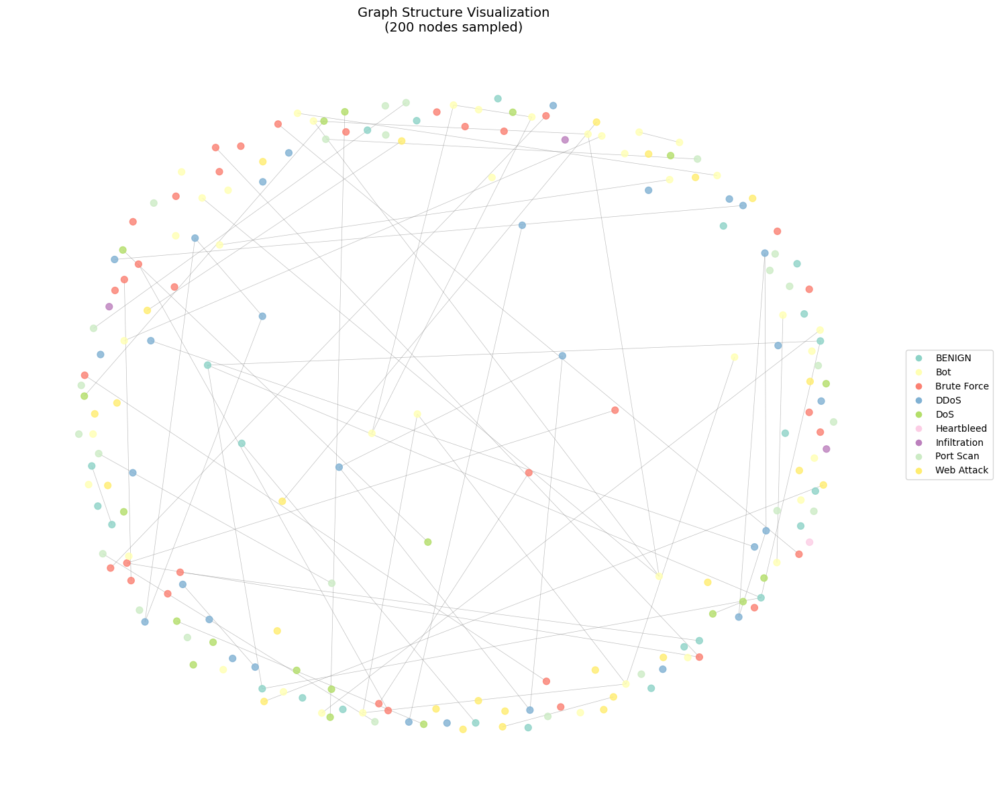

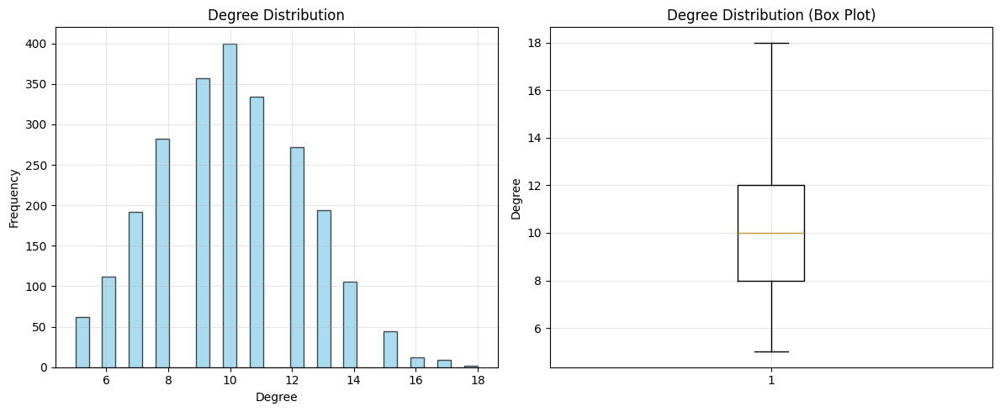

Degree statistics:
  Mean degree: 10.00
  Std degree: 2.38
  Min degree: 5
  Max degree: 18

STEP 4: DATA SPLITTING
Class distribution: {np.int64(0): np.int64(333), np.int64(1): np.int64(333), np.int64(2): np.int64(333), np.int64(3): np.int64(333), np.int64(4): np.int64(333), np.int64(5): np.int64(11), np.int64(6): np.int64(36), np.int64(7): np.int64(333), np.int64(8): np.int64(333)}
Train: 1426, Val: 476, Test: 476

STEP 5: MODEL TRAINING
Model parameters: 26889
Starting training...
Epoch 000, Loss: 2.2267, Train Acc: 0.8205, Val Acc: 0.8382
Epoch 010, Loss: 0.4184, Train Acc: 0.9425, Val Acc: 0.9307
Epoch 020, Loss: 0.3222, Train Acc: 0.9628, Val Acc: 0.9580
Epoch 030, Loss: 0.2338, Train Acc: 0.9698, Val Acc: 0.9559
Epoch 040, Loss: 0.1889, Train Acc: 0.9755, Val Acc: 0.9559
Epoch 050, Loss: 0.1894, Train Acc: 0.9769, Val Acc: 0.9622
Epoch 060, Loss: 0.1683, Train Acc: 0.9783, Val Acc: 0.9601
Epoch 070, Loss: 0.1890, Train Acc: 0.9769, Val Acc: 0.9685
Epoch 080, Loss: 0.1602, Train 

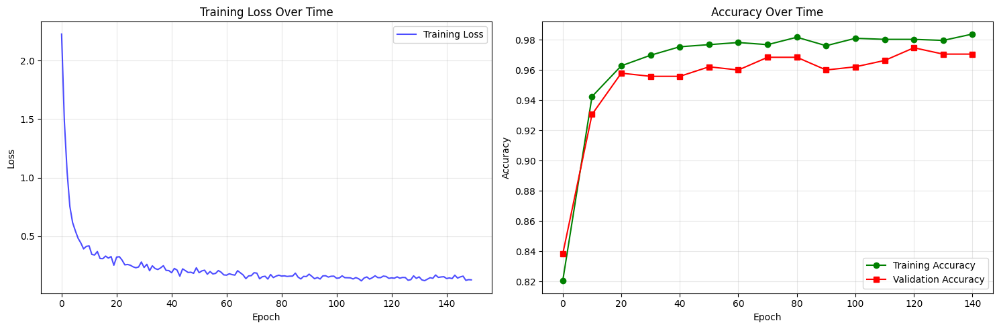


STEP 6: MODEL EVALUATION
Final Test Accuracy: 0.9538

Confusion Matrix:


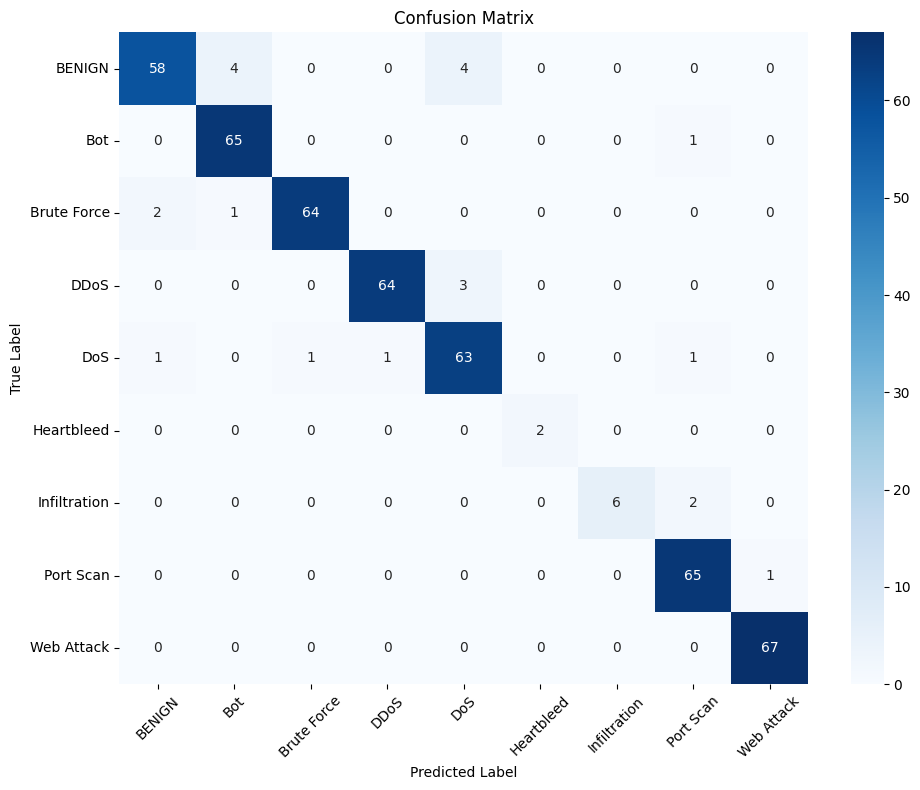

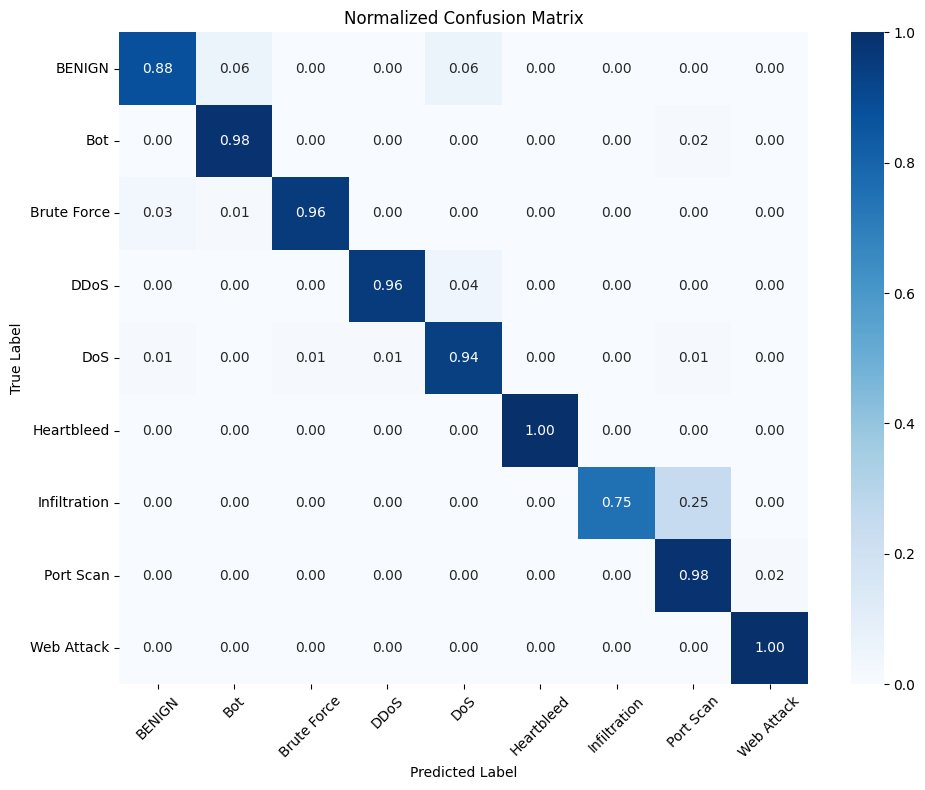


Per-class Performance:


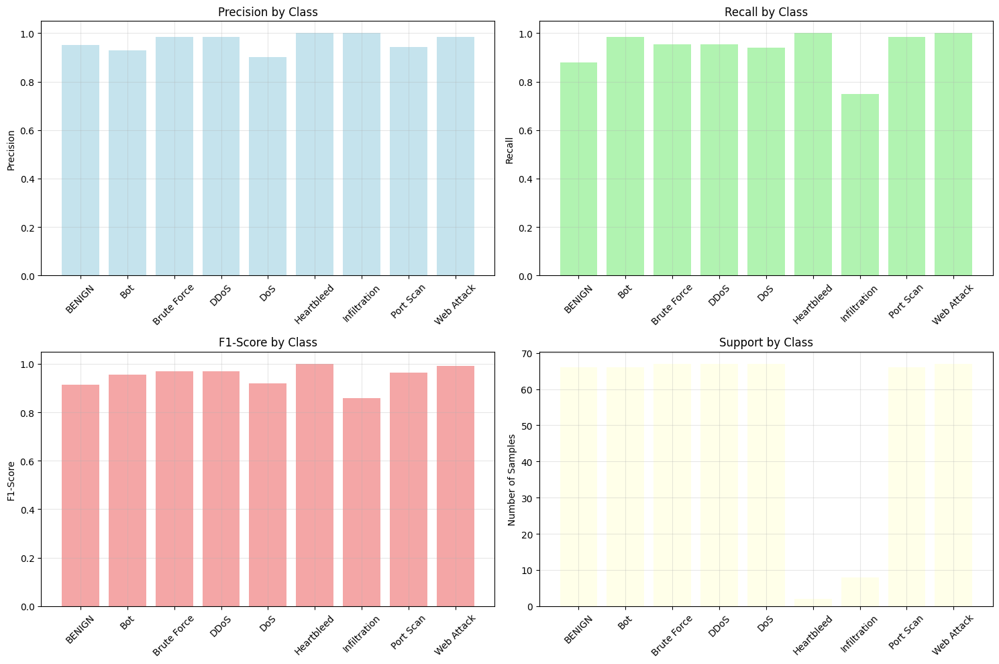

          Class  Precision    Recall  F1-Score  Support
0        BENIGN   0.950820  0.878788  0.913386       66
1           Bot   0.928571  0.984848  0.955882       66
2   Brute Force   0.984615  0.955224  0.969697       67
3          DDoS   0.984615  0.955224  0.969697       67
4           DoS   0.900000  0.940299  0.919708       67
5    Heartbleed   1.000000  1.000000  1.000000        2
6  Infiltration   1.000000  0.750000  0.857143        8
7     Port Scan   0.942029  0.984848  0.962963       66
8    Web Attack   0.985294  1.000000  0.992593       67

Detailed Classification Report:
              precision    recall  f1-score   support

      BENIGN       0.95      0.88      0.91        66
         Bot       0.93      0.98      0.96        66
 Brute Force       0.98      0.96      0.97        67
        DDoS       0.98      0.96      0.97        67
         DoS       0.90      0.94      0.92        67
  Heartbleed       1.00      1.00      1.00         2
Infiltration       1.00     

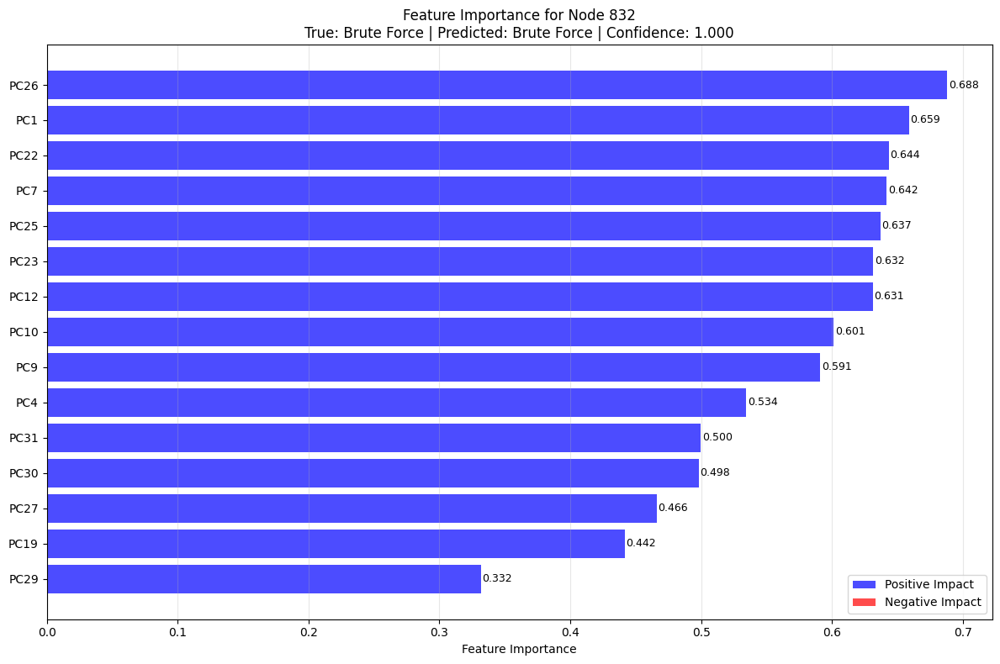

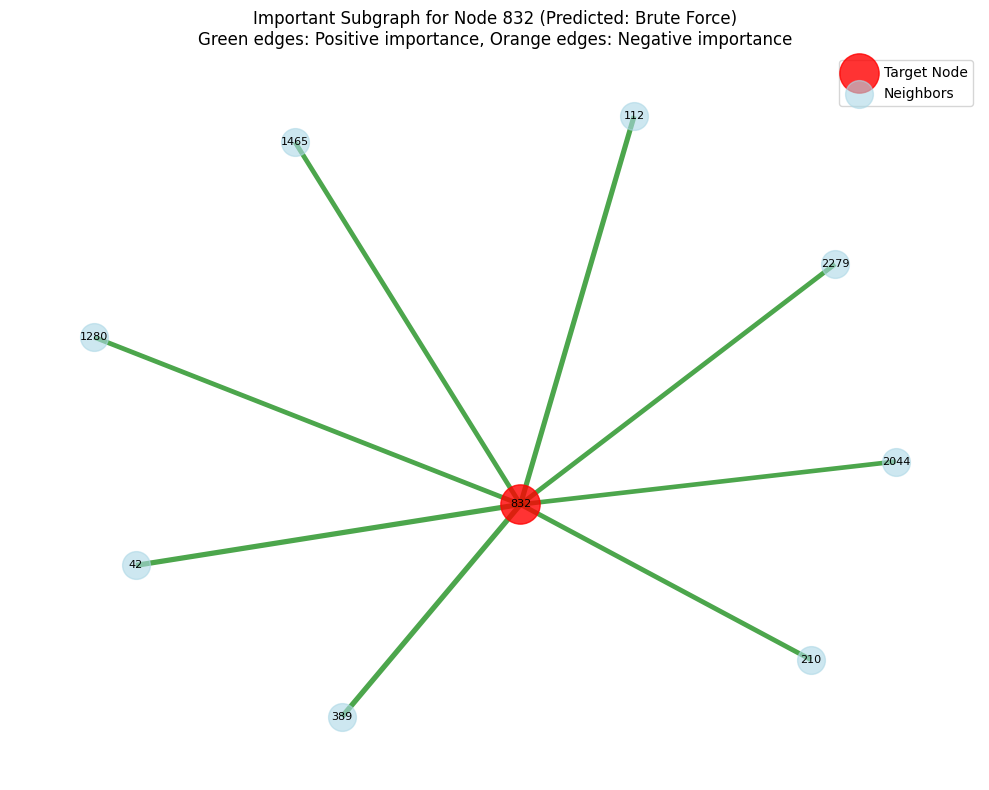


Explaining correctly classified Bot (Node 1794):
Explaining prediction for node 1794
True class: DoS
Predicted class: DoS
Confidence: 0.9920
Correct prediction: True


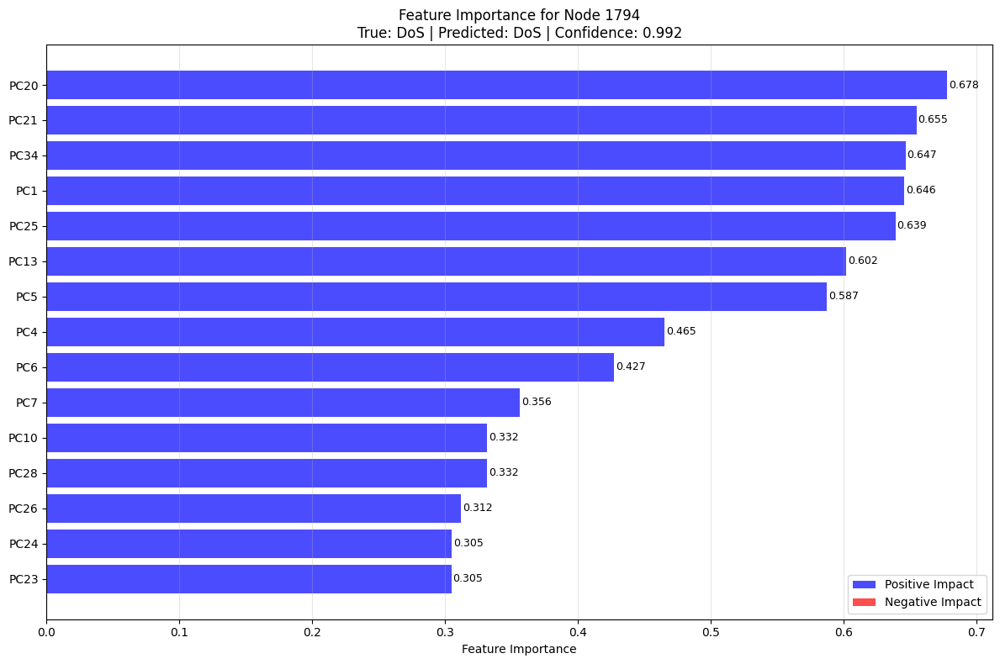

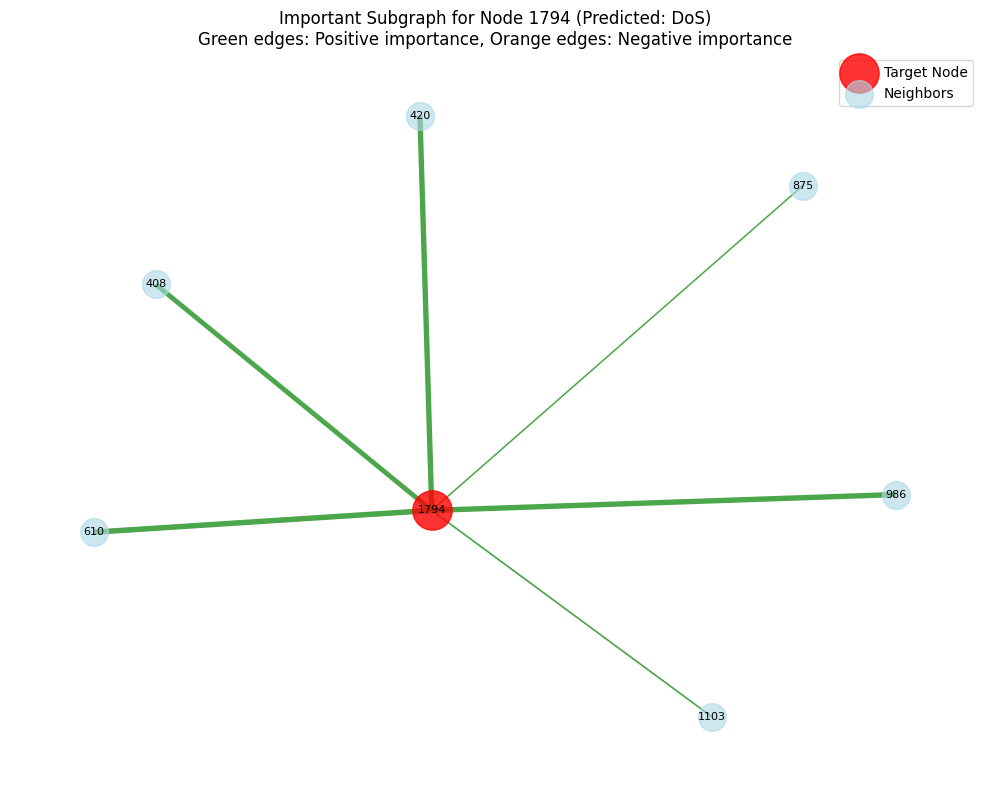


Explaining correctly classified Brute Force (Node 1096):
Explaining prediction for node 1096
True class: DoS
Predicted class: DoS
Confidence: 0.9999
Correct prediction: True


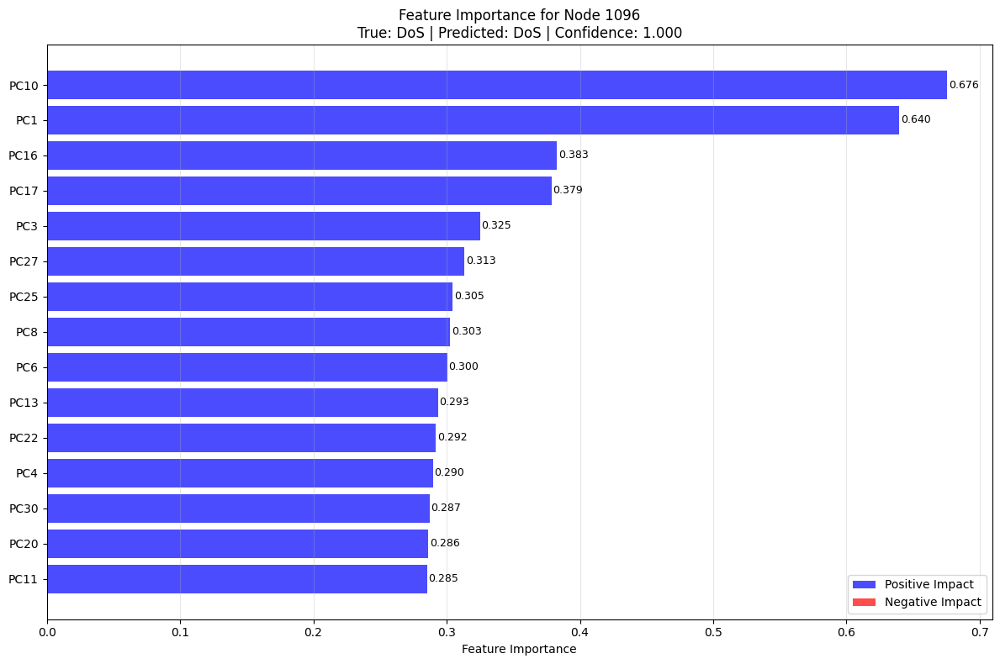

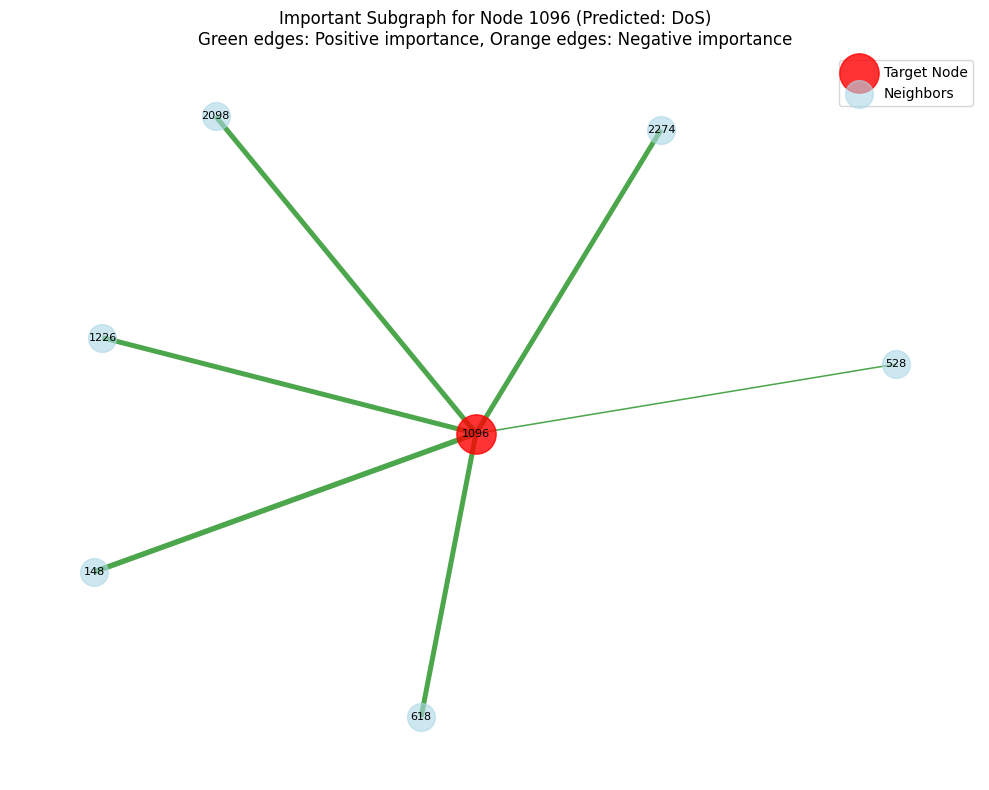


--- INCORRECTLY CLASSIFIED EXAMPLES ---

Explaining misclassification (Node 1174):
  True: BENIGN, Predicted: DoS
Explaining prediction for node 1174
True class: Bot
Predicted class: Bot
Confidence: 0.9272
Correct prediction: True


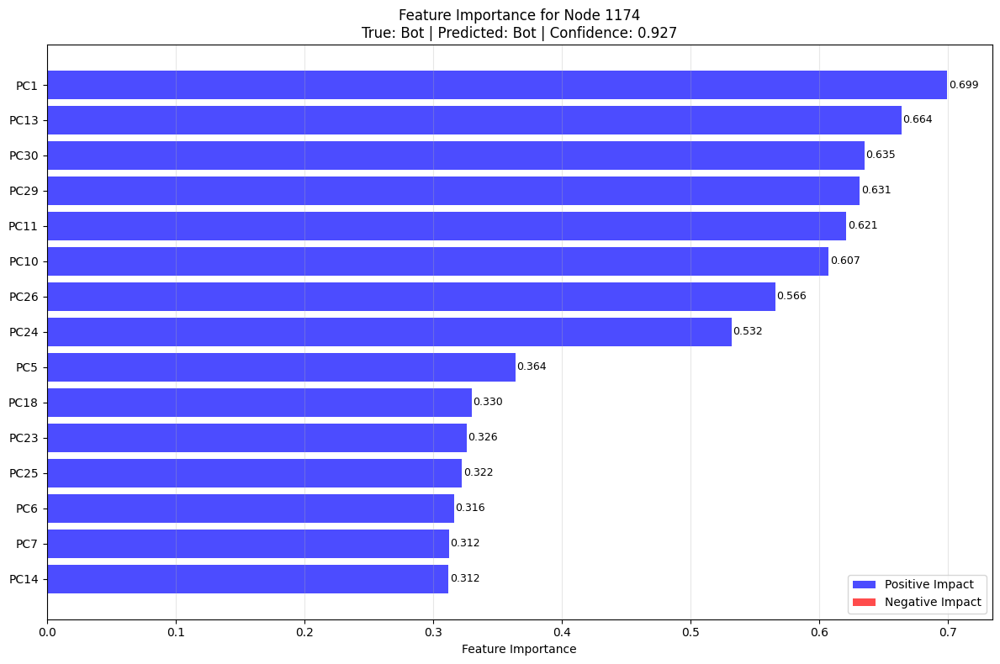

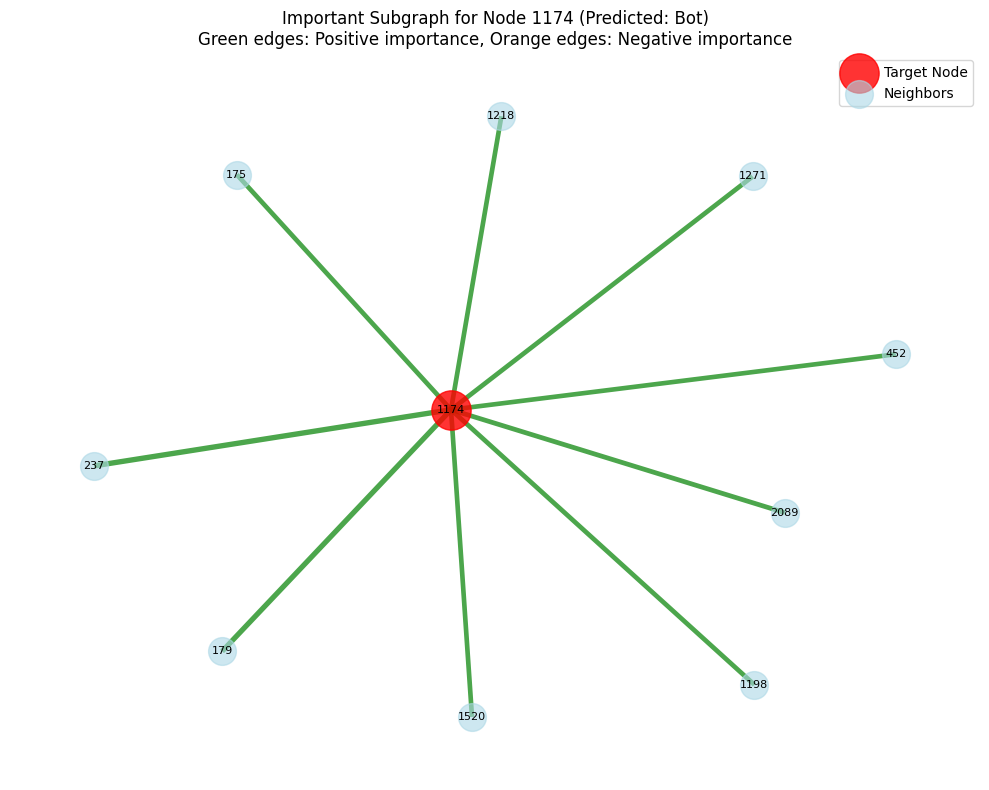


Explaining misclassification (Node 1911):
  True: BENIGN, Predicted: Bot
Explaining prediction for node 1911
True class: DoS
Predicted class: DoS
Confidence: 1.0000
Correct prediction: True


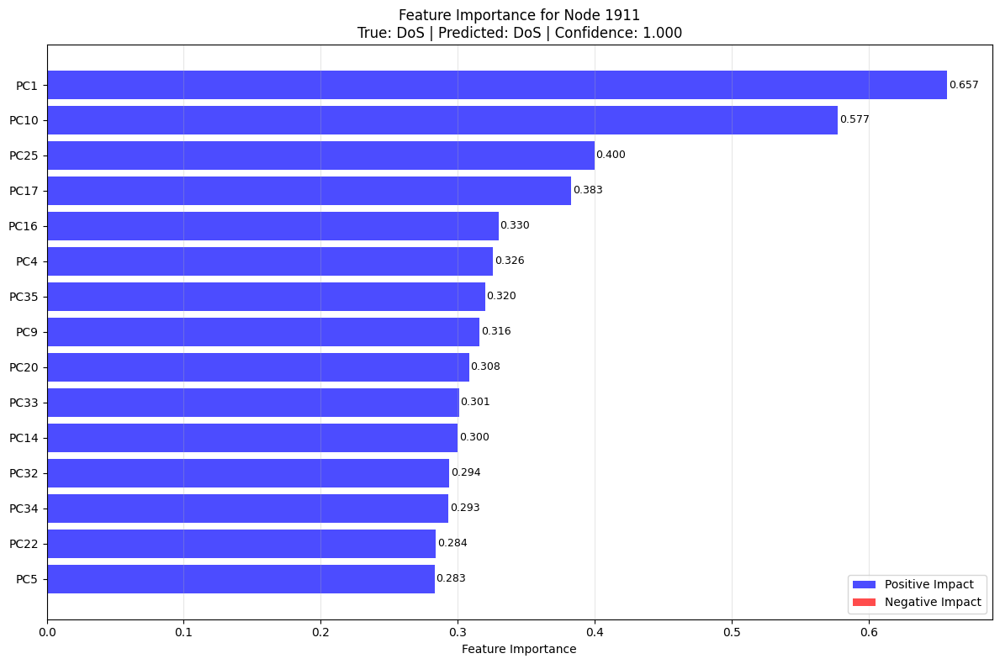

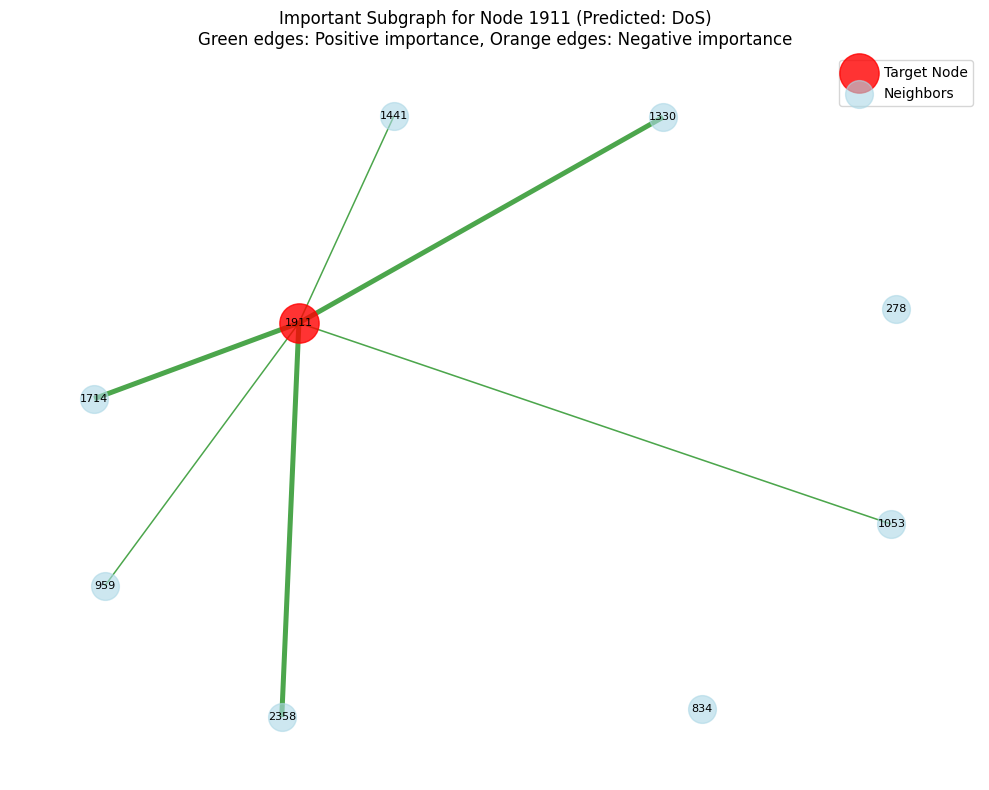


STEP 8: ATTACK PATTERN ANALYSIS
Attack types in test set: ['BENIGN', 'Bot', 'Brute Force', 'DDoS', 'DoS', 'Heartbleed', 'Infiltration', 'Port Scan', 'Web Attack']

Analyzing feature patterns for BENIGN...
Explaining prediction for node 2219
True class: Bot
Predicted class: Bot
Confidence: 0.9953
Correct prediction: True
Explaining prediction for node 742
True class: Brute Force
Predicted class: Brute Force
Confidence: 0.9988
Correct prediction: True
  ✅ Pattern extracted for BENIGN

Analyzing feature patterns for Bot...
Explaining prediction for node 255
True class: Port Scan
Predicted class: Port Scan
Confidence: 0.9997
Correct prediction: True
Explaining prediction for node 987
True class: DDoS
Predicted class: DDoS
Confidence: 0.9903
Correct prediction: True
  ✅ Pattern extracted for Bot

Analyzing feature patterns for Brute Force...
Explaining prediction for node 1454
True class: BENIGN
Predicted class: BENIGN
Confidence: 0.9993
Correct prediction: True
Explaining prediction for n

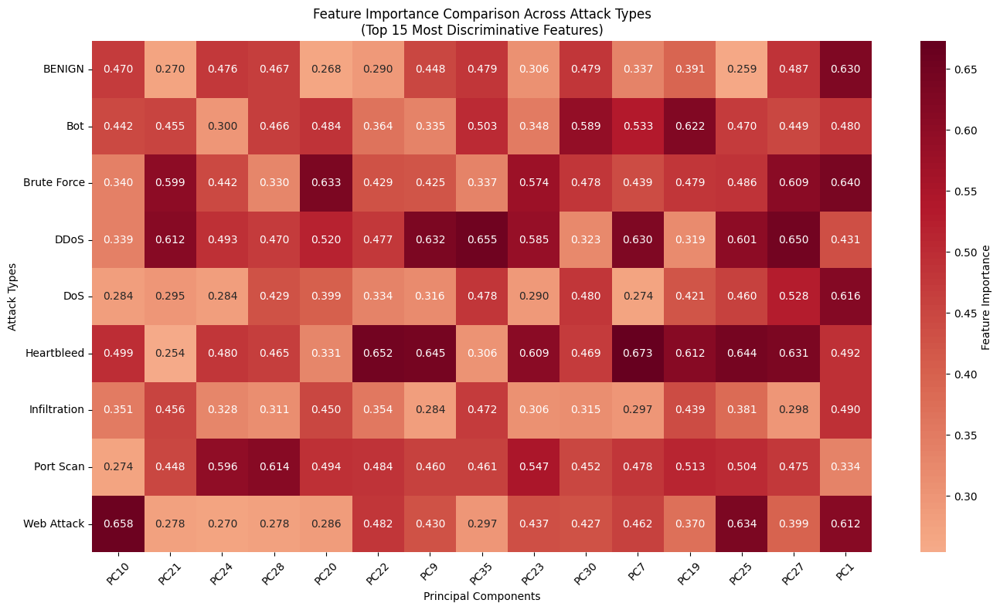


--- ALTERNATIVE FEATURE ANALYSIS ---
Analyzing model activations by class...


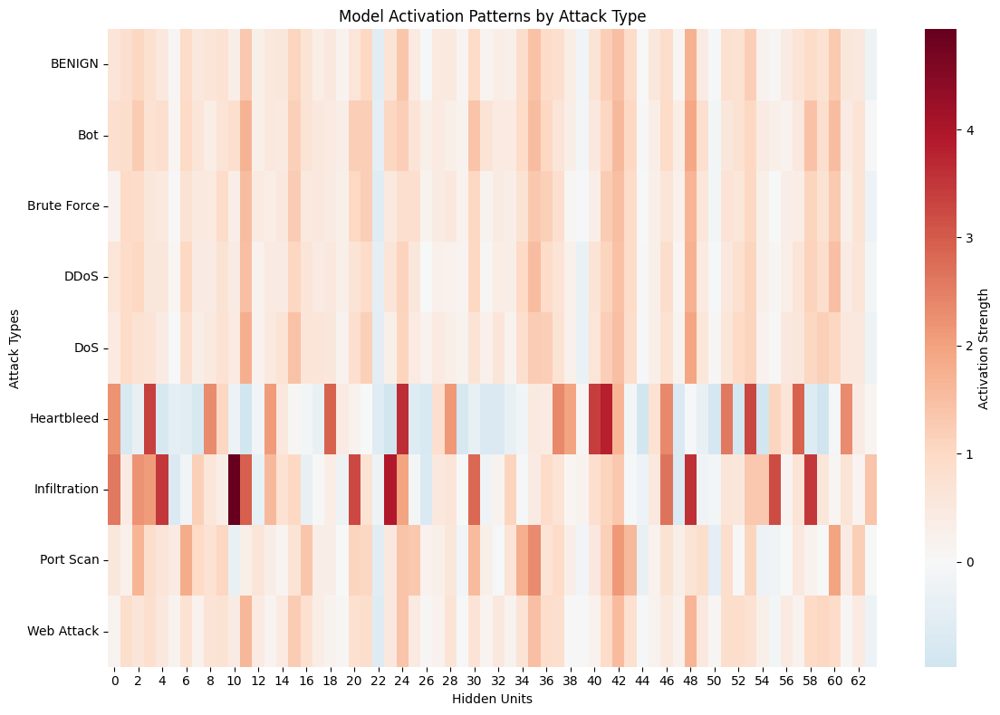

✅ Model activation analysis completed

ANALYSIS SUMMARY
✅ Dataset: 2378 nodes, 11890 edges
✅ Model: GAT with 26889 parameters
✅ Test Accuracy: 0.9538
✅ Classes: 9

📊 Key Insights:
1. Graph structure visualization shows connectivity patterns
2. Training curves indicate model convergence
3. Confusion matrix reveals class-specific performance
4. GNN explanations identify important features and subgraphs
5. Attack pattern analysis shows discriminative features

🎉 Quick test completed successfully!
📈 Test Accuracy: 0.9538


In [ ]:
results = quick_apt_test(pca_df)

COMPREHENSIVE APT DETECTION WITH VISUALIZATIONS
Using device: cpu

STEP 1: DATA PREPARATION
Preparing data...
Original data shape: (2522362, 36)
Class distribution:
Attack Type
BENIGN          2096484
DoS              193748
DDoS             128016
Port Scan         90819
Brute Force        9152
Web Attack         2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: count, dtype: int64
After filtering rare classes: (2522362, 36)
Remaining classes: 9
Sampling 5000 rows from 2522362 total rows...
Final sampled data shape: (3932, 36)
Final class distribution:
Attack Type
Port Scan       555
DDoS            555
Bot             555
Brute Force     555
Web Attack      555
DoS             555
BENIGN          555
Infiltration     36
Heartbleed       11
Name: count, dtype: int64
Final data shape: (3932, 35)
Classes: 9

STEP 2: GRAPH CONSTRUCTION
Creating KNN edges with k=5...
Created 19660 edges
Graph: 3932 nodes, 19660 edges

STEP 3: GRAPH VISUALIZATION
Creating g

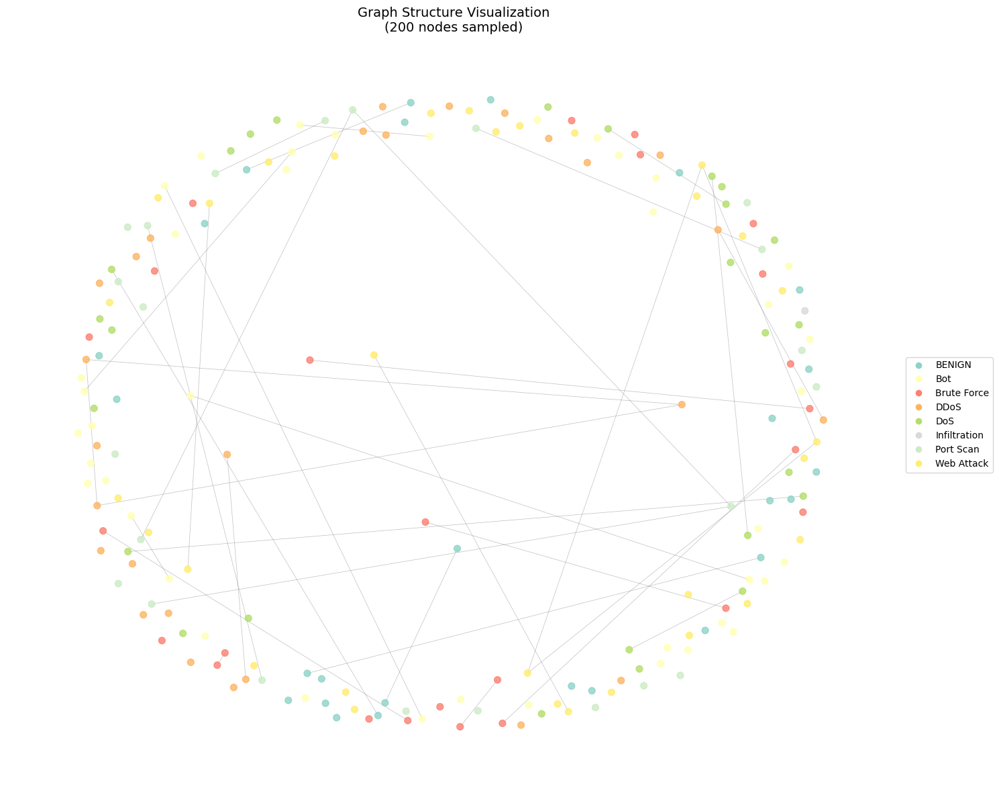

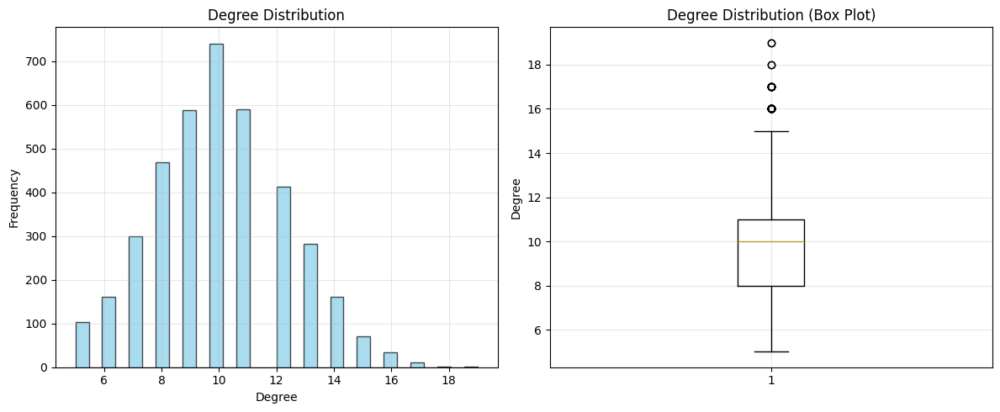

Degree statistics:
  Mean degree: 10.00
  Std degree: 2.34
  Min degree: 5
  Max degree: 19

STEP 4: DATA SPLITTING
Class distribution: {np.int64(0): np.int64(555), np.int64(1): np.int64(555), np.int64(2): np.int64(555), np.int64(3): np.int64(555), np.int64(4): np.int64(555), np.int64(5): np.int64(11), np.int64(6): np.int64(36), np.int64(7): np.int64(555), np.int64(8): np.int64(555)}
Train: 2359, Val: 786, Test: 787

STEP 5: MODEL TRAINING
Model parameters: 26889
Starting training...
Epoch 000, Loss: 2.3049, Train Acc: 0.7999, Val Acc: 0.8079
Epoch 010, Loss: 0.3281, Train Acc: 0.9572, Val Acc: 0.9555
Epoch 020, Loss: 0.2465, Train Acc: 0.9716, Val Acc: 0.9606
Epoch 030, Loss: 0.1924, Train Acc: 0.9750, Val Acc: 0.9606
Epoch 040, Loss: 0.1854, Train Acc: 0.9792, Val Acc: 0.9669
Epoch 050, Loss: 0.1427, Train Acc: 0.9860, Val Acc: 0.9746
Epoch 060, Loss: 0.1285, Train Acc: 0.9809, Val Acc: 0.9669
Epoch 070, Loss: 0.1351, Train Acc: 0.9864, Val Acc: 0.9758
Epoch 080, Loss: 0.1412, Train 

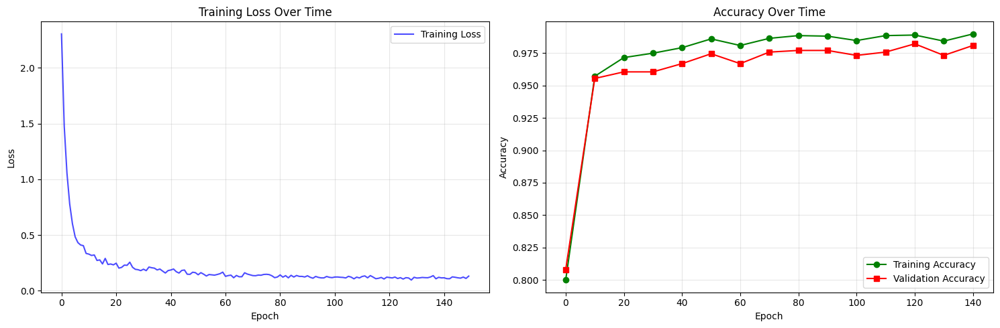


STEP 6: MODEL EVALUATION
Final Test Accuracy: 0.9682

Confusion Matrix:


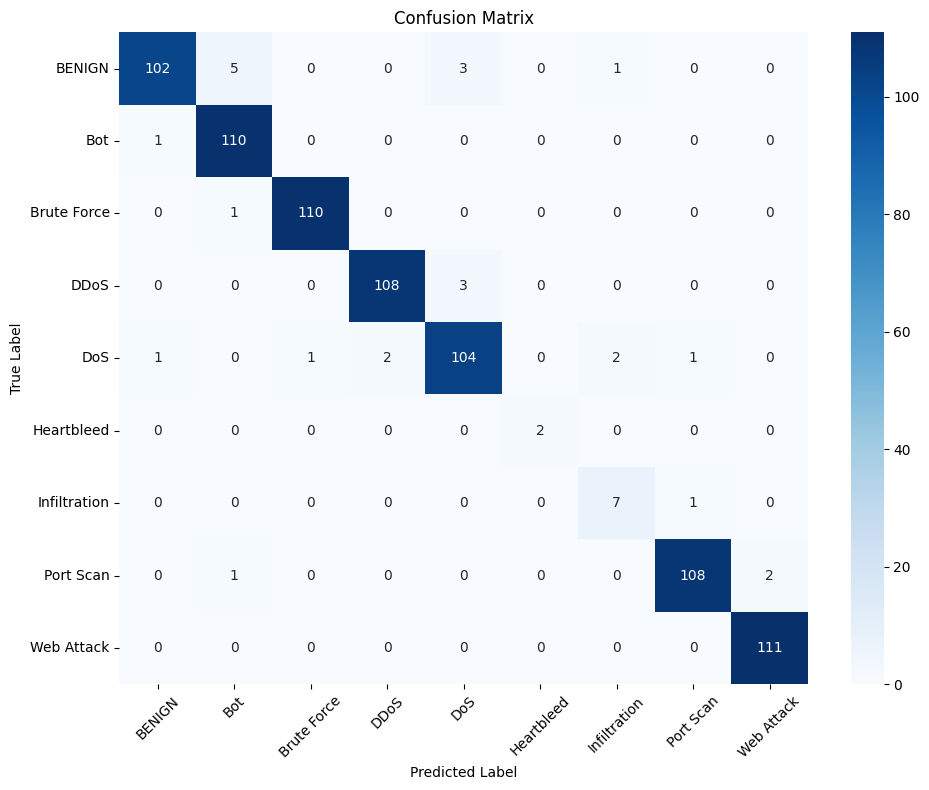

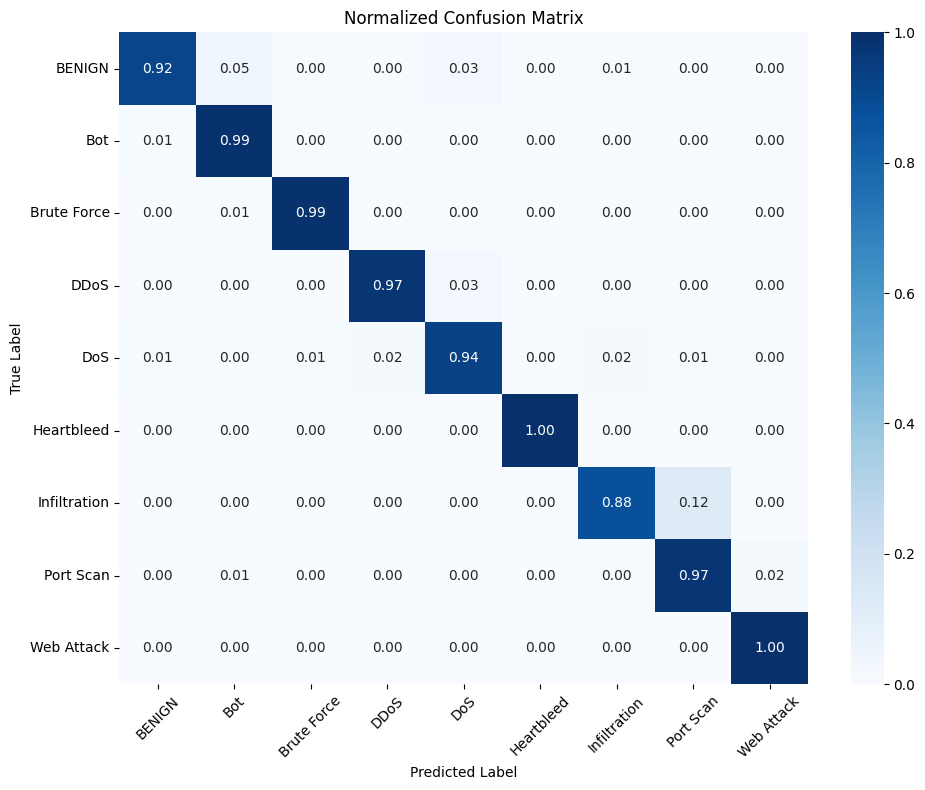


Per-class Performance:


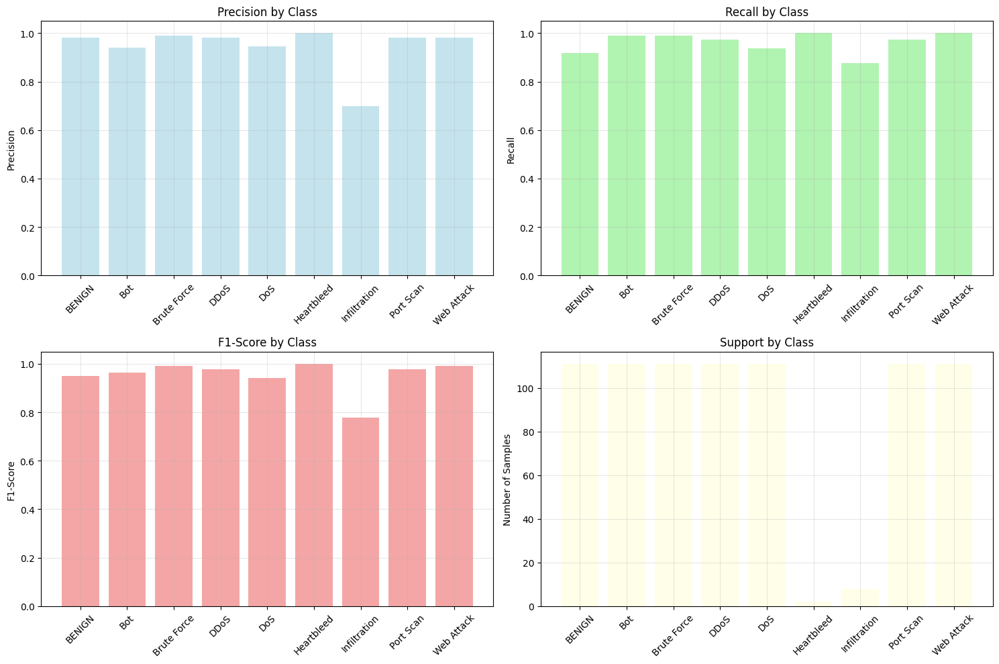

          Class  Precision    Recall  F1-Score  Support
0        BENIGN   0.980769  0.918919  0.948837      111
1           Bot   0.940171  0.990991  0.964912      111
2   Brute Force   0.990991  0.990991  0.990991      111
3          DDoS   0.981818  0.972973  0.977376      111
4           DoS   0.945455  0.936937  0.941176      111
5    Heartbleed   1.000000  1.000000  1.000000        2
6  Infiltration   0.700000  0.875000  0.777778        8
7     Port Scan   0.981818  0.972973  0.977376      111
8    Web Attack   0.982301  1.000000  0.991071      111

Detailed Classification Report:
              precision    recall  f1-score   support

      BENIGN       0.98      0.92      0.95       111
         Bot       0.94      0.99      0.96       111
 Brute Force       0.99      0.99      0.99       111
        DDoS       0.98      0.97      0.98       111
         DoS       0.95      0.94      0.94       111
  Heartbleed       1.00      1.00      1.00         2
Infiltration       0.70     

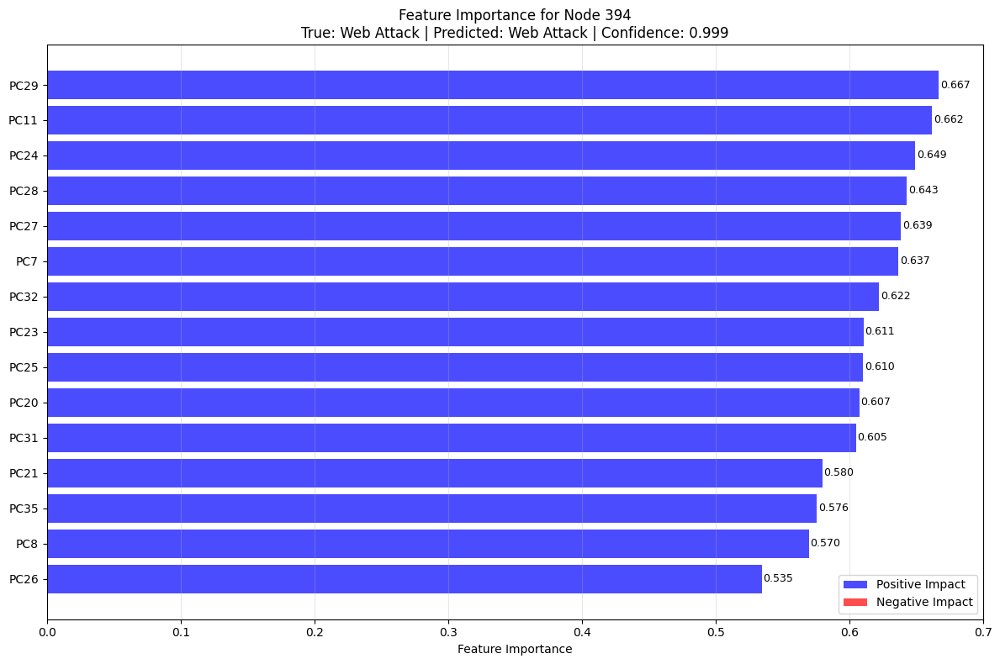

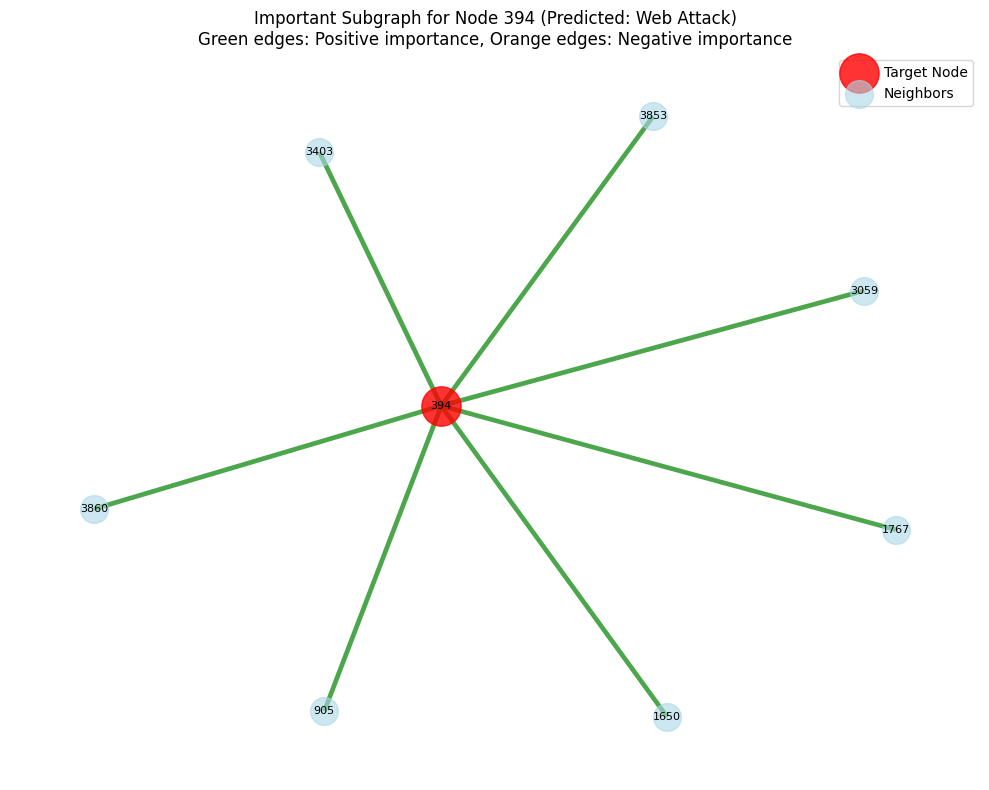


Explaining correctly classified Bot (Node 2572):
Explaining prediction for node 2572
True class: Web Attack
Predicted class: Web Attack
Confidence: 0.9988
Correct prediction: True


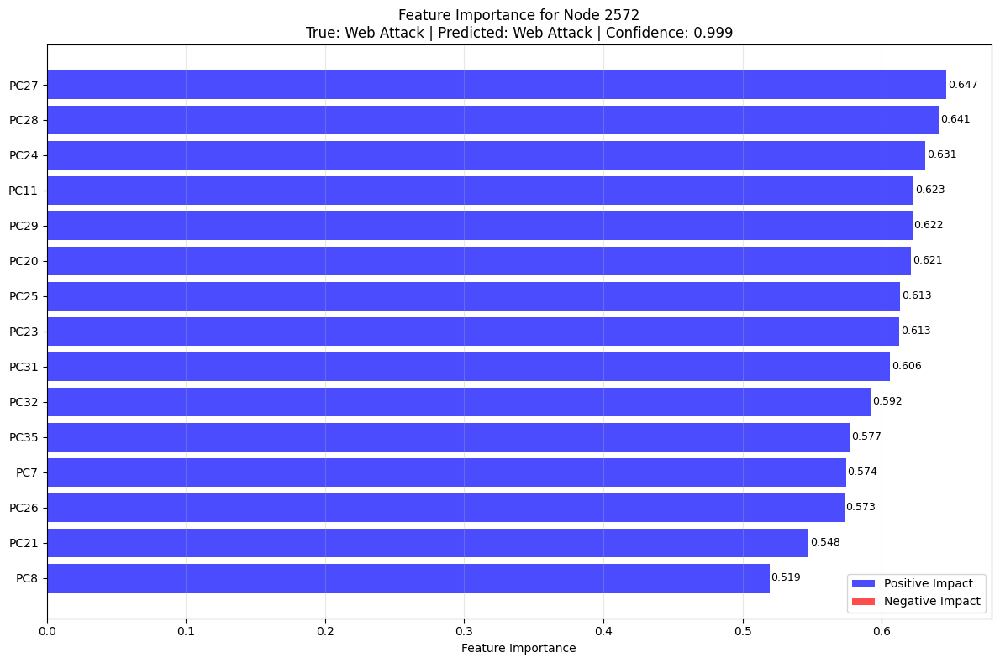

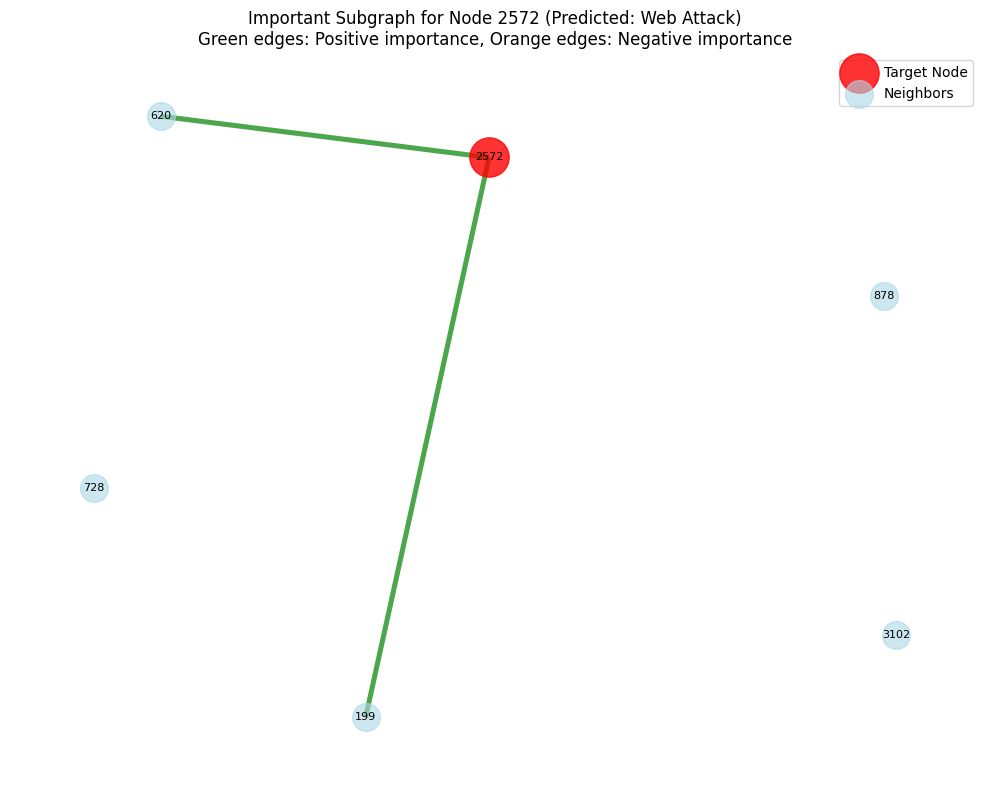


Explaining correctly classified Brute Force (Node 2892):
Explaining prediction for node 2892
True class: BENIGN
Predicted class: BENIGN
Confidence: 0.9985
Correct prediction: True


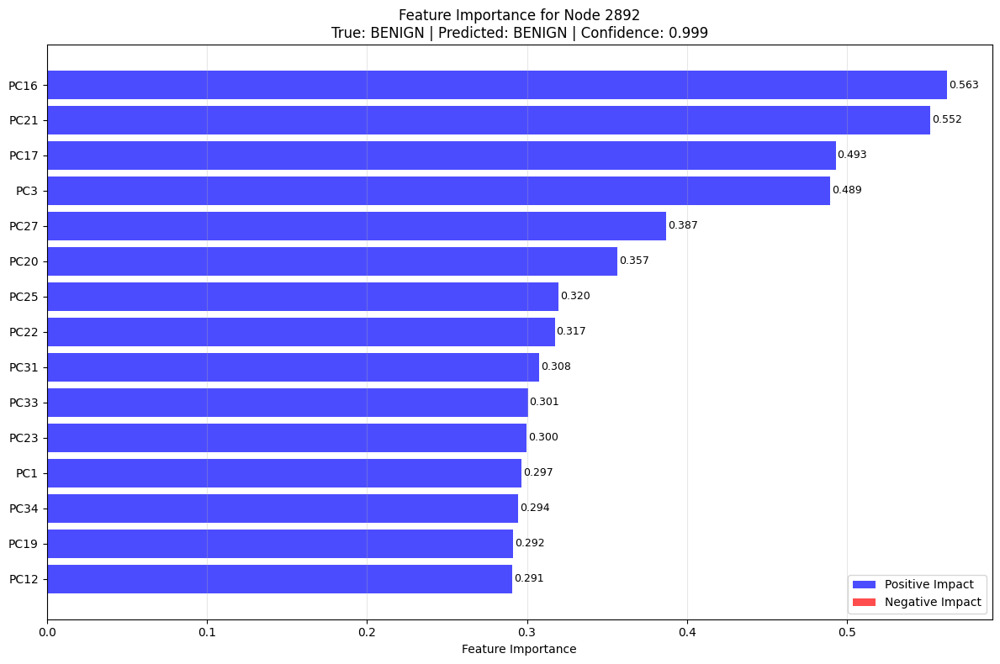

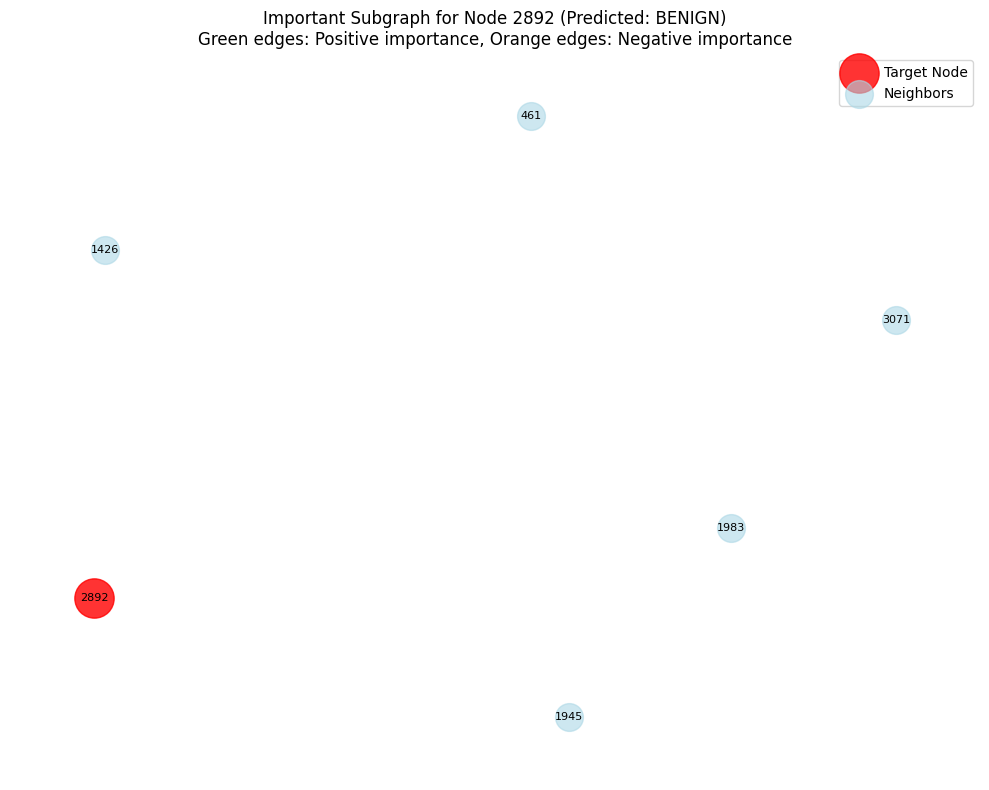


--- INCORRECTLY CLASSIFIED EXAMPLES ---

Explaining misclassification (Node 3734):
  True: DoS, Predicted: DDoS
Explaining prediction for node 3734
True class: Port Scan
Predicted class: Port Scan
Confidence: 0.9999
Correct prediction: True


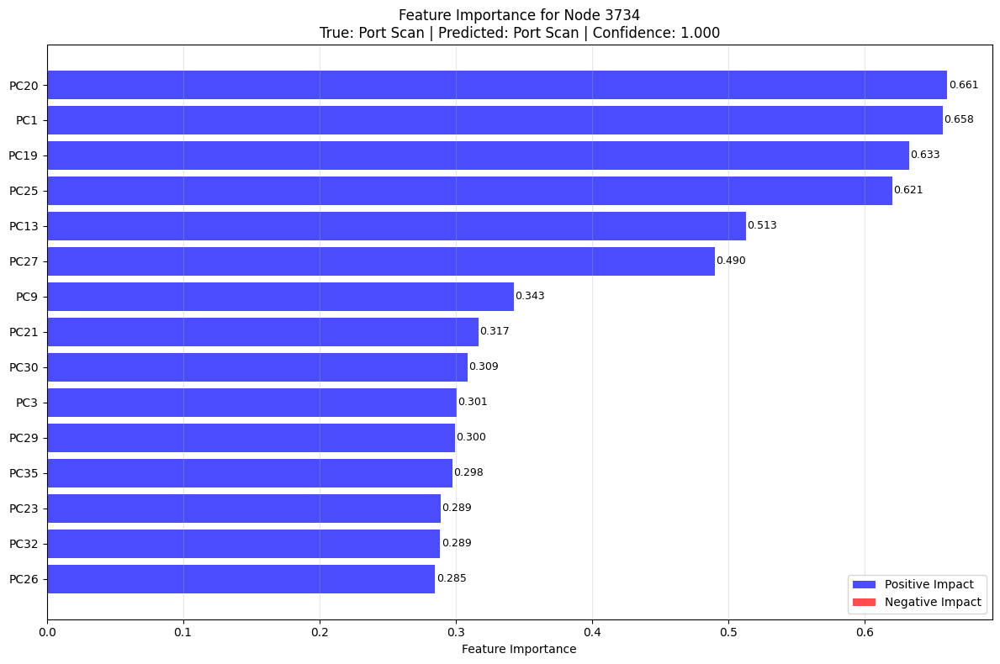

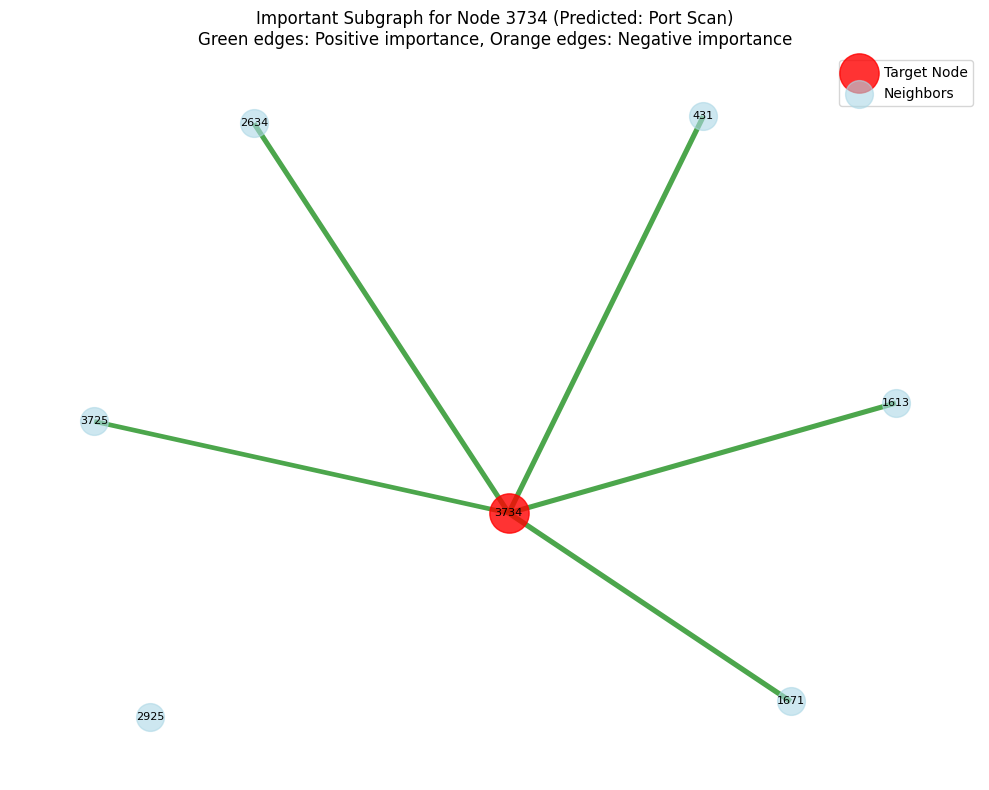


Explaining misclassification (Node 814):
  True: BENIGN, Predicted: Infiltration
Explaining prediction for node 814
True class: BENIGN
Predicted class: BENIGN
Confidence: 0.9998
Correct prediction: True


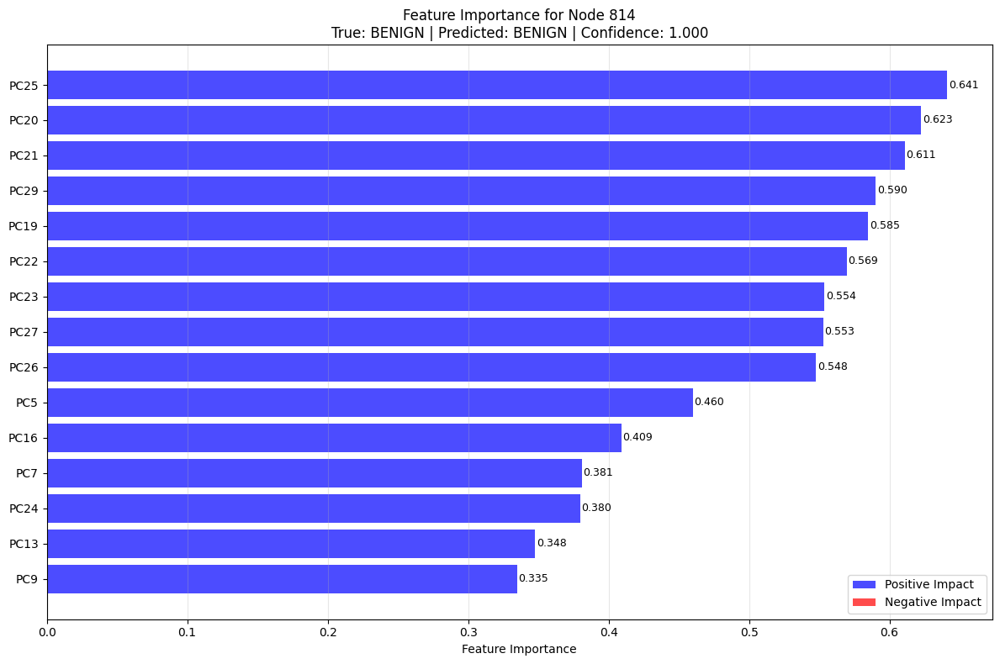

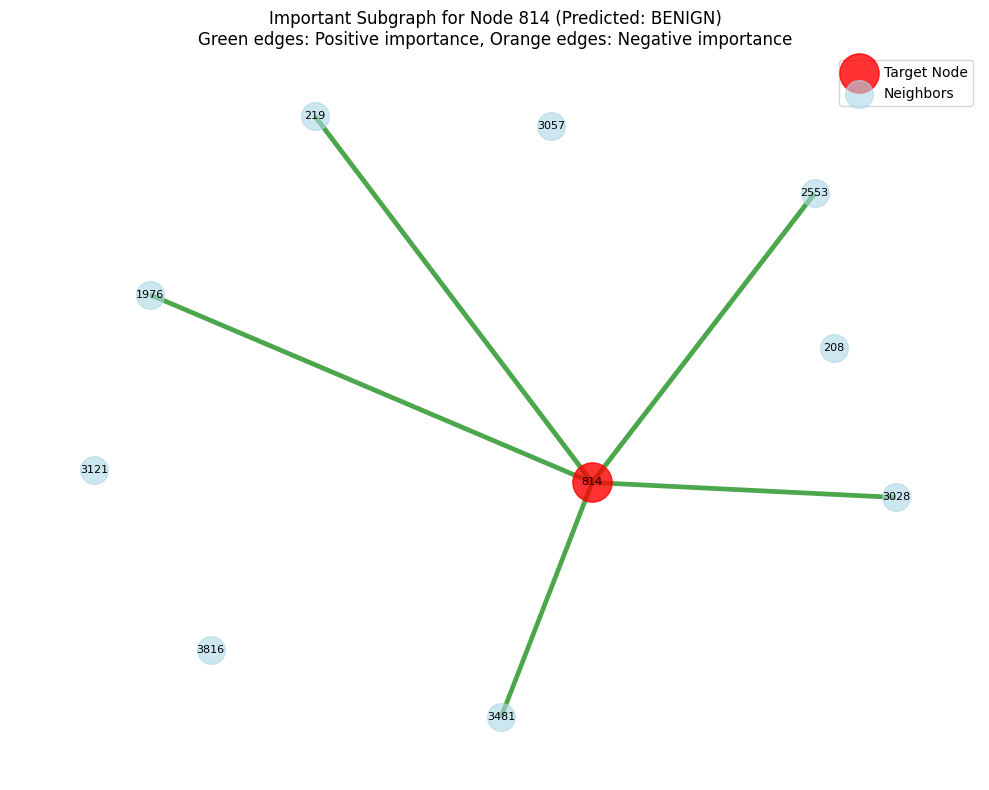


STEP 8: ATTACK PATTERN ANALYSIS
Attack types in test set: ['BENIGN', 'Bot', 'Brute Force', 'DDoS', 'DoS', 'Heartbleed', 'Infiltration', 'Port Scan', 'Web Attack']

Analyzing feature patterns for BENIGN...
Explaining prediction for node 1883
True class: Web Attack
Predicted class: Web Attack
Confidence: 0.9988
Correct prediction: True
Explaining prediction for node 3593
True class: Infiltration
Predicted class: Infiltration
Confidence: 1.0000
Correct prediction: True
  ✅ Pattern extracted for BENIGN

Analyzing feature patterns for Bot...
Explaining prediction for node 4
True class: Bot
Predicted class: Bot
Confidence: 0.9575
Correct prediction: True
Explaining prediction for node 2192
True class: DoS
Predicted class: DoS
Confidence: 0.9999
Correct prediction: True
  ✅ Pattern extracted for Bot

Analyzing feature patterns for Brute Force...
Explaining prediction for node 989
True class: DoS
Predicted class: Port Scan
Confidence: 0.3969
Correct prediction: False
Explaining prediction for

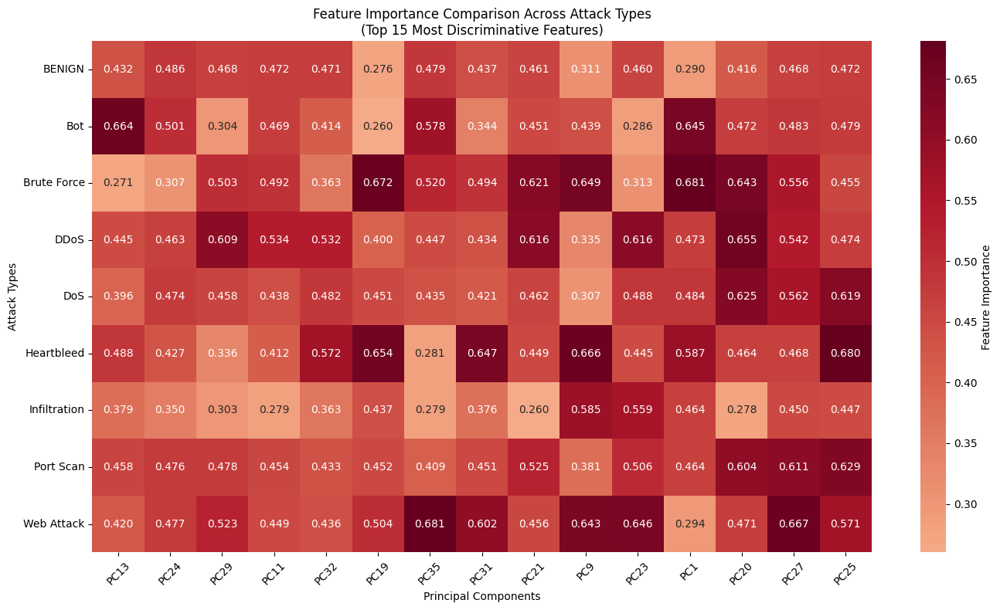


--- ALTERNATIVE FEATURE ANALYSIS ---
Analyzing model activations by class...


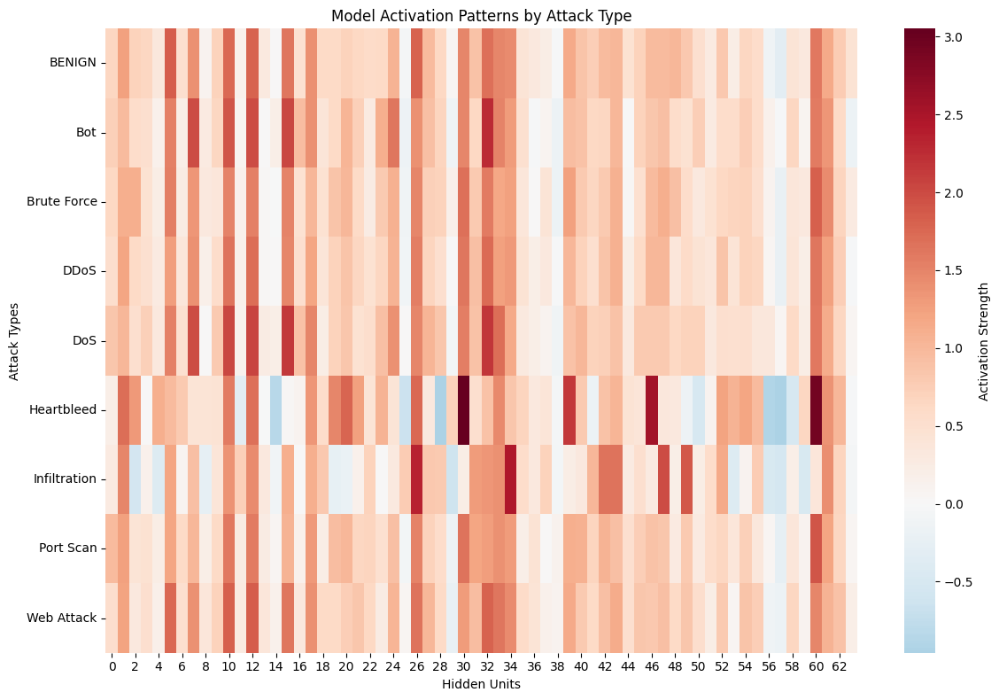

✅ Model activation analysis completed

ANALYSIS SUMMARY
✅ Dataset: 3932 nodes, 19660 edges
✅ Model: GAT with 26889 parameters
✅ Test Accuracy: 0.9682
✅ Classes: 9

📊 Key Insights:
1. Graph structure visualization shows connectivity patterns
2. Training curves indicate model convergence
3. Confusion matrix reveals class-specific performance
4. GNN explanations identify important features and subgraphs
5. Attack pattern analysis shows discriminative features


In [ ]:
results = run_comprehensive_apt_detection(pca_df)

In [ ]:
import torch
import pickle
import os
from datetime import datetime

def save_model(results, name="apt_model"):
    """Simple model saving function"""

    # Create timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{name}_{timestamp}"

    print(f"💾 Saving model: {filename}")

    # Save everything in one file
    torch.save({
        'model_state_dict': results['model'].state_dict(),
        'preprocessor': results['preprocessor'],
        'test_accuracy': results['test_accuracy'],
        'model_config': {
            'input_dim': results['data'].x.shape[1],
            'output_dim': len(results['preprocessor'].label_encoder.classes_),
            'hidden_dim': 64,
            'num_heads': 4,
            'dropout': 0.3
        },
        'class_names': results['preprocessor'].label_encoder.classes_
    }, f"{filename}.pth")

    print(f" Model saved as: {filename}.pth")
    print(f" Test Accuracy: {results['test_accuracy']:.4f}")

    return filename

def load_model(filename, device='cpu'):
    """Simple model loading function"""

    print(f"📂 Loading model: {filename}")

    # Load checkpoint
    checkpoint = torch.load(f"{filename}.pth", map_location=device)

    # Recreate model (you need to have the model class available)
    from your_enhanced_code import LightweightGAT  # Import your model class

    model = LightweightGAT(
        input_dim=checkpoint['model_config']['input_dim'],
        hidden_dim=checkpoint['model_config']['hidden_dim'],
        output_dim=checkpoint['model_config']['output_dim'],
        num_heads=checkpoint['model_config']['num_heads'],
        dropout=checkpoint['model_config']['dropout']
    )

    # Load weights
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()

    print(f" Model loaded successfully!")
    print(f" Saved Accuracy: {checkpoint['test_accuracy']:.4f}")
    print(f"  Classes: {list(checkpoint['class_names'])}")

    return {
        'model': model,
        'preprocessor': checkpoint['preprocessor'],
        'accuracy': checkpoint['test_accuracy'],
        'classes': checkpoint['class_names']
    }



In [ ]:

filename = save_model(results)

💾 Saving model: apt_model_20250727_172003
 Model saved as: apt_model_20250727_172003.pth
 Test Accuracy: 0.9682


In [ ]:
import torch
import pickle
import os
from datetime import datetime

def save_model(results, name="apt_model", save_dir="models"):
    """Enhanced model saving function with error handling"""

    # Create models directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{name}_{timestamp}"
    filepath = os.path.join(save_dir, f"{filename}.pth")

    print(f"💾 Saving model: {filename}")

    try:
        # Save everything in one file
        torch.save({
            'model_state_dict': results['model'].state_dict(),
            'preprocessor': results['preprocessor'],
            'test_accuracy': results['test_accuracy'],
            'model_config': {
                'input_dim': results['data'].x.shape[1],
                'output_dim': len(results['preprocessor'].label_encoder.classes_),
                'hidden_dim': 64,
                'num_heads': 4,
                'dropout': 0.3
            },
            'class_names': results['preprocessor'].label_encoder.classes_,
            'pytorch_version': torch.__version__,
            'save_timestamp': timestamp
        }, filepath, _use_new_zipfile_serialization=False)

        print(f"✅ Model saved as: {filepath}")
        print(f"📊 Test Accuracy: {results['test_accuracy']:.4f}")

        return filename

    except Exception as e:
        print(f"❌ Error saving model: {str(e)}")
        return None

def load_model(filename, device='cpu', model_class=None, save_dir="models"):
    """Enhanced model loading function with better error handling"""

    # Handle different filename formats
    if not filename.endswith('.pth'):
        filepath = os.path.join(save_dir, f"{filename}.pth")
    else:
        filepath = os.path.join(save_dir, filename)

    # Check if file exists
    if not os.path.exists(filepath):
        print(f"❌ Model file not found: {filepath}")
        return None

    print(f"📂 Loading model: {filename}")

    try:
        # Load checkpoint with weights_only=False for custom objects
        checkpoint = torch.load(filepath, map_location=device, weights_only=False)

        # Auto-detect model class if not provided
        if model_class is None:
            try:
                # Try to import from the main module
                from __main__ import LightweightGAT
                model_class = LightweightGAT
            except ImportError:
                try:
                    # Try alternative import paths
                    from your_enhanced_code import LightweightGAT
                    model_class = LightweightGAT
                except ImportError:
                    print("❌ Could not find LightweightGAT class. Please provide model_class parameter.")
                    return None

        # Recreate model
        model = model_class(
            input_dim=checkpoint['model_config']['input_dim'],
            hidden_dim=checkpoint['model_config']['hidden_dim'],
            output_dim=checkpoint['model_config']['output_dim'],
            num_heads=checkpoint['model_config']['num_heads'],
            dropout=checkpoint['model_config']['dropout']
        )

        # Load weights
        model.load_state_dict(checkpoint['model_state_dict'])
        model.to(device)
        model.eval()

        print(f"✅ Model loaded successfully!")
        print(f"📊 Saved Accuracy: {checkpoint['test_accuracy']:.4f}")
        print(f"🏷️  Classes: {list(checkpoint['class_names'])}")

        # Show additional info if available
        if 'pytorch_version' in checkpoint:
            print(f"🔧 Saved with PyTorch: {checkpoint['pytorch_version']}")
        if 'save_timestamp' in checkpoint:
            print(f"⏰ Saved on: {checkpoint['save_timestamp']}")

        return {
            'model': model,
            'preprocessor': checkpoint['preprocessor'],
            'accuracy': checkpoint['test_accuracy'],
            'classes': checkpoint['class_names'],
            'config': checkpoint['model_config']
        }

    except Exception as e:
        print(f"❌ Error loading model: {str(e)}")
        print("💡 If you get UnpicklingError, the model may have been saved with the old format.")
        print("   Try using weights_only=False or re-saving with the new format.")
        return None

def list_saved_models(save_dir="models"):
    """List all saved models in the directory"""

    if not os.path.exists(save_dir):
        print(f"📂 No models directory found: {save_dir}")
        return []

    model_files = [f for f in os.listdir(save_dir) if f.endswith('.pth')]

    if not model_files:
        print(f"📂 No models found in: {save_dir}")
        return []

    print(f"📂 Found {len(model_files)} saved models:")
    for i, filename in enumerate(sorted(model_files), 1):
        filepath = os.path.join(save_dir, filename)
        size_mb = os.path.getsize(filepath) / (1024 * 1024)
        print(f"  {i}. {filename} ({size_mb:.1f} MB)")

    return model_files

# Usage example:
"""
# Save model
filename = save_model(results)

# Load model
loaded_results = load_model(filename)

# List available models
list_saved_models()

# Load with specific model class
from your_model_file import YourModelClass
loaded_results = load_model(filename, model_class=YourModelClass)
"""

'\n# Save model\nfilename = save_model(results)\n\n# Load model\nloaded_results = load_model(filename)\n\n# List available models\nlist_saved_models()\n\n# Load with specific model class\nfrom your_model_file import YourModelClass\nloaded_results = load_model(filename, model_class=YourModelClass)\n'

In [ ]:
# Save model
filename = save_model(results)
# Load model
loaded_results = load_model(filename)
# List available models
list_saved_models()



💾 Saving model: apt_model_20250727_175822
✅ Model saved as: models/apt_model_20250727_175822.pth
📊 Test Accuracy: 0.9682
📂 Loading model: apt_model_20250727_175822
✅ Model loaded successfully!
📊 Saved Accuracy: 0.9682
🏷️  Classes: ['BENIGN', 'Bot', 'Brute Force', 'DDoS', 'DoS', 'Heartbleed', 'Infiltration', 'Port Scan', 'Web Attack']
🔧 Saved with PyTorch: 2.6.0+cu124
⏰ Saved on: 20250727_175822
📂 Found 2 saved models:
  1. apt_model_20250727_175703.pth (0.1 MB)
  2. apt_model_20250727_175822.pth (0.1 MB)


['apt_model_20250727_175703.pth', 'apt_model_20250727_175822.pth']